# Precio de la vivienda en Colombia
En este trabajo abordaremos la evolucion del precio de las viviendas en colombia entre 2020 y 2021, teniendo en cuenta factores geograficos y del bien inmobiliario, que nos permitiran asi efectuar un analisis estadistico completo a partir del cual podremos explicar cual es el impacto de distintas variables en el precio de los hogares y asi establecer ciertas condiciones primordiales para estudiar este fenomeno de la vivienda en el país.

### Importamos librerias necesarias para el análisis

In [2]:
!pip install hvplot

In [3]:
#===============================================================================================================================================
#Importamos las librerias necesarias para la visualización de los datos, analisis estadistico y un pequeño apartado dedicado al machine learning
#===============================================================================================================================================
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
#import statsmodels.api as sm
import seaborn as sns
import scipy.stats as stats
from scipy.stats import norm, beta, lognorm, gamma
from scipy.stats import kstest
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler, OneHotEncoder
from sklearn.ensemble import RandomForestRegressor
from sklearn.pipeline import Pipeline
from sklearn.metrics import mean_absolute_error
from sklearn.compose import ColumnTransformer
from sklearn.compose import make_column_transformer
import warnings
warnings.filterwarnings("ignore", category=RuntimeWarning)
import hvplot.pandas

from tensorflow import keras
from tensorflow.keras import layers

### Lectura de los datos

In [4]:
data = pd.read_csv('co_properties.csv')
df = pd.DataFrame(data)
df

,id,ad_type,start_date,end_date,created_on,lat,lon,l1,l2,l3,...,bathrooms,surface_total,surface_covered,price,currency,price_period,title,description,property_type,operation_type
0,KsjahK62rxcYKXXQjOdkqw==,Propiedad,2020-10-07,2021-10-09,2020-10-07,3.921000,-76.506000,Colombia,Valle del Cauca,NaN,...,7.0,NaN,NaN,1.300000e+09,COP,NaN,Casa Campestre en venta en darien 3469064,"HERMOSA CASA CAMPESTRE, &Aacute;REA 6,000 MT, ...",Casa,Venta
1,Y+gsBZYq1zu5NoR3V5oUGA==,Propiedad,2020-10-07,2021-01-06,2020-10-07,3.357700,-76.541811,Colombia,Valle del Cauca,Cali,...,7.0,NaN,NaN,2.800000e+09,COP,NaN,Casa en ciudsd jardin,Casa independiente con posiciona en ciudad jar...,Casa,Venta
2,Jpzqxj8/Vgf3Aa5ASxUBNg==,Propiedad,2020-10-07,2020-10-07,2020-10-07,3.357700,-76.541811,Colombia,Valle del Cauca,Cali,...,7.0,NaN,NaN,2.800000e+09,COP,Mensual,Casa en ciudsd jardin,Casa independiente con posiciona en ciudad jar...,Casa,Venta
3,ieuFnkFx/yHDD66iMV14Gw==,Propiedad,2020-10-07,2021-04-12,2020-10-07,3.364000,-76.538000,Colombia,Valle del Cauca,Cali,...,8.0,NaN,NaN,3.500000e+09,COP,NaN,Casa en venta en pance 1630426,"EXCELENTE CASA - LOTE 6,373 MT, EN OBRA GRIS U...",Casa,Venta
4,g4u5JM+hAHEk8SukRSjMzg==,Propiedad,2020-10-07,9999-12-31,2020-10-07,3.391000,-76.517000,Colombia,Valle del Cauca,Cali,...,9.0,NaN,NaN,4.800000e+08,COP,NaN,CASA EXTERNA BARRIO CIUDAD 2000,"CASA EXTERNA EN EL BARRIO CIUDAD 2000,CONSTRUI...",Casa,Venta
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
999995,HogfsSTtBvNDJkf98/FGIw==,Propiedad,2021-03-31,2021-05-18,2021-03-31,6.186412,-75.658630,Colombia,Antioquia,Medellín,...,1.0,NaN,NaN,7.000000e+05,COP,NaN,"APARTAMENTO EN ARRIENDO, SAN ANTONIO DE PRADO-...",Apartamento de 48 Mts2 ubicado en conjunto cer...,Apartamento,Arriendo
999996,1LxE1UMbfMeW5Dv/z4rqJA==,Propiedad,2021-03-31,2021-05-18,2021-03-31,6.186412,-75.658630,Colombia,Antioquia,Medellín,...,1.0,NaN,NaN,7.000000e+05,COP,NaN,"APARTAMENTO EN ARRIENDO, SAN ANTONIO DE PRADO-...",Apartamento de 48 Mts2 ubicado en conjunto cer...,Apartamento,Arriendo
999997,NEIrzJXLpHqPDIXwD+9r8w==,Propiedad,2021-03-31,2021-05-07,2021-03-31,6.186412,-75.658630,Colombia,Antioquia,Medellín,...,1.0,NaN,NaN,7.000000e+05,COP,NaN,"APARTAMENTO EN ARRIENDO, SAN ANTONIO DE PRADO-...",Apartamento de 48 Mts2 ubicado en conjunto cer...,Apartamento,Arriendo
999998,fpxqXlGPqDwKhuZVQGxCPA==,Propiedad,2021-03-31,9999-12-31,2021-03-31,11.015336,-74.831347,Colombia,Atlántico,Barranquilla,...,4.0,NaN,NaN,7.000000e+08,COP,NaN,Casa en venta La Castellana,<b>Casa en venta La Castellana</b><br><br>Herm...,Casa,Venta


### Información basica de la base de datos

In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1000000 entries, 0 to 999999
Data columns (total 25 columns):
 #   Column           Non-Null Count    Dtype  
---  ------           --------------    -----  
 0   id               1000000 non-null  object 
 1   ad_type          1000000 non-null  object 
 2   start_date       1000000 non-null  object 
 3   end_date         1000000 non-null  object 
 4   created_on       1000000 non-null  object 
 5   lat              740281 non-null   float64
 6   lon              740282 non-null   float64
 7   l1               1000000 non-null  object 
 8   l2               1000000 non-null  object 
 9   l3               937188 non-null   object 
 10  l4               273995 non-null   object 
 11  l5               159127 non-null   object 
 12  l6               54747 non-null    object 
 13  rooms            172087 non-null   float64
 14  bedrooms         376046 non-null   float64
 15  bathrooms        799493 non-null   float64
 16  surface_total    41

Selección de las columnas de interes

La columna ```l1``` corresponde al país; de igual manera, este dataset corresponde unicamente a vivienda en Colombia. Las otras columnas poco relevantes del dataset son: ```id, ad_type, description, price_period, title```

## Limpieza del dataset

Eliminamos las columnas :<span style="color:red;">```['id', 'ad_type', 'l1', 'description', 'price_period', 'title', 'currency', 'start_date', 'end_date', 'created_on']``` </span>, ya que no nos entregan información relevante para el analisís, esto gracias a la cantidad de valores nulos e información irrelevante como ```['id, description']```.

In [6]:
Drop_Cols = ['id', 'ad_type', 'l1', 'l4', 'l5', 'l6','description', 'price_period', 'title', 'currency', 'start_date', 'end_date', 'created_on', 'surface_covered']
df = df.drop(Drop_Cols, axis=1)

df.dropna(axis=0, subset=['price', 'rooms'], inplace=True)

df

,lat,lon,l2,l3,rooms,bedrooms,bathrooms,surface_total,price,property_type,operation_type
55,4.826252,-75.683261,Risaralda,NaN,4.0,4.0,NaN,NaN,270000000.0,Casa,Venta
56,4.816264,-75.696573,Risaralda,NaN,4.0,4.0,NaN,NaN,180000000.0,Casa,Venta
57,4.541471,-75.664193,Quindío,NaN,4.0,4.0,NaN,NaN,2000000.0,Casa,Arriendo
58,4.826252,-75.683261,Risaralda,NaN,4.0,4.0,NaN,NaN,270000000.0,Casa,Venta
59,4.816751,-75.711253,Risaralda,NaN,4.0,4.0,NaN,NaN,130000000.0,Casa,Venta
...,...,...,...,...,...,...,...,...,...,...,...
999919,4.626792,-74.127068,Cundinamarca,Bogotá D.C,3.0,3.0,NaN,NaN,400000000.0,Apartamento,Venta
999933,4.597044,-74.160915,Cundinamarca,Bogotá D.C,2.0,2.0,NaN,NaN,150000000.0,Apartamento,Venta
999988,4.635000,-74.148000,Cundinamarca,Bogotá D.C,3.0,3.0,1.0,62.0,780000.0,Apartamento,Arriendo
999991,4.644055,-74.128511,Cundinamarca,Bogotá D.C,3.0,3.0,NaN,NaN,410000000.0,Apartamento,Venta


In [7]:
print('Total instances of dataset:', df.shape[0] * df.shape[1])

Total instances of dataset: 1891417


In [8]:
df = df.rename(columns={'l2':'Department', 'l3':'City'})

In [9]:
# Filtramos los departamentos donde las ciudades son NaN
departments_without_cities = df.groupby('Department')['City'].apply(lambda x: x.isnull().all())

# Extraemos el nombre de estos departamentos
departments_without_cities = departments_without_cities[departments_without_cities].index.tolist()

print("Departments with no registered cities:")
print(departments_without_cities)

Departments with no registered cities:
['Arauca', 'Chocó', 'Florida', 'Guainía', 'Guaviare', 'Nariño', 'Putumayo']


In [10]:
# Creamos un diccionario con el que reemplazamos cada departamento sin ciudades
manual_fill = {
    'Arauca': 'Arauca',
    'Chocó': 'Quibdó',
    'Florida': 'Florida',
    'Guainía': 'Inirida',
    'Guaviare': 'San José del Guaviare',
    'Nariño': 'Pasto',
    'Putumayo': 'Mocoa'
}

# reemplazamos los valores faltantes de esos departamentos
for depto, ciudad in manual_fill.items():
    df.loc[(df['Department'] == depto) & (df['City'].isnull()), 'City'] = ciudad

Teniendo en cuenta la distribución de las ciudades basada en los departamentos, los datos faltantes los vamos a agregar usando la distribución de los departamentos asociados

In [11]:
#Nos aseguramos de que 'City' esta en formato strng y los valores NaN estan bien definidos
df['City'] = df['City'].astype('object')

#Creamos una función para agregar los valores faltates de 'City' basados en la distribución dentro de cada 'Department'
def impute_city(group):
    if group['City'].isnull().sum() == 0:
        return group
    # Obtenemos la distribución de las ciudades conocidas en el departamento
    city_dist = group['City'].value_counts(normalize=True)
    missing_idx = group['City'].isnull()
    # Elegimos ciudades al azar de acuerdo a la distribución
    imputed = np.random.choice(
        city_dist.index,
        size=missing_idx.sum(),
        p=city_dist.values
    )
    group.loc[missing_idx, 'City'] = imputed
    return group

# Aplicamos la función a cada grupo
df = df.groupby('Department', group_keys=False).apply(impute_city).reset_index(drop=True)

C:\Users\User\AppData\Local\Temp\ipykernel_9868\3984386740.py:21: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  df = df.groupby('Department', group_keys=False).apply(impute_city).reset_index(drop=True)


Hacemos un proceso similar para ```['lat', 'lon']```

In [12]:
import numpy as np

def impute_numeric_by_city(group, col):
    if group[col].isnull().sum() == 0:
        return group

    # Obtener la distribución (frecuencias relativas) de los valores conocidos en la columna
    value_dist = group[col].value_counts(normalize=True)

    # Si no hay valores para imputar (grupo vacío), no hacer nada
    if value_dist.empty:
        return group

    missing_idx = group[col].isnull()

    # Muestrear valores según la distribución observada
    imputed = np.random.choice(
        value_dist.index.to_numpy(),
        size=missing_idx.sum(),
        p=value_dist.values
    )

    group.loc[missing_idx, col] = imputed
    return group

df = df.groupby('City', group_keys=False).apply(lambda g: impute_numeric_by_city(g, 'lat'))
df = df.groupby('City', group_keys=False).apply(lambda g: impute_numeric_by_city(g, 'lon'))

C:\Users\User\AppData\Local\Temp\ipykernel_9868\1818601389.py:26: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  df = df.groupby('City', group_keys=False).apply(lambda g: impute_numeric_by_city(g, 'lat'))
C:\Users\User\AppData\Local\Temp\ipykernel_9868\1818601389.py:27: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  df = df.groupby('City', group_keys=False).apply(lambda g: impute_numeric_by_city(g, 'lon'))


In [13]:
# Filas con valores nulos en "lat" o en "lon"
filas_nulas = df[df['lat'].isnull() | df['lon'].isnull()]

print(filas_nulas)

        lat  lon    Department              City  rooms  bedrooms  bathrooms  \
56202   NaN  NaN      Amazonas        El Encanto    1.0       1.0        1.0   
56392   NaN  NaN      Amazonas        El Encanto    2.0       2.0        2.0   
159018  NaN  NaN  Cundinamarca  Carmen de Carupa    3.0       3.0        2.0   

        surface_total        price property_type operation_type  
56202             NaN     850000.0   Apartamento       Arriendo  
56392             NaN    1300000.0   Apartamento       Arriendo  
159018          550.0  220000000.0          Casa          Venta  


In [14]:
# For El Encanto (Amazonas)
df.loc[(df['Department'] == 'Amazonas') & (df['City'] == 'El Encanto') & (df['lat'].isnull() | df['lon'].isnull()), ['lat', 'lon']] = [-1.747777, -73.208611]

# For Carmen de Carupa (Cundinamarca)
df.loc[(df['Department'] == 'Cundinamarca') & (df['City'] == 'Carmen de Carupa') & (df['lat'].isnull() | df['lon'].isnull()), ['lat', 'lon']] = [5.350277, -73.901388]

# For  Boyacá       Santa Sofía
df.loc[(df['Department'] == 'Boyacá') & (df['City'] == 'Santa Sofía') & (df['lat'].isnull() | df['lon'].isnull()), ['lat', 'lon']] = [5.713611, -73.603055]

In [15]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 171947 entries, 0 to 171946
Data columns (total 11 columns):
 #   Column          Non-Null Count   Dtype  
---  ------          --------------   -----  
 0   lat             171947 non-null  float64
 1   lon             171947 non-null  float64
 2   Department      171947 non-null  object 
 3   City            171947 non-null  object 
 4   rooms           171947 non-null  float64
 5   bedrooms        171112 non-null  float64
 6   bathrooms       66894 non-null   float64
 7   surface_total   31861 non-null   float64
 8   price           171947 non-null  float64
 9   property_type   171947 non-null  object 
 10  operation_type  171947 non-null  object 
dtypes: float64(7), object(4)
memory usage: 19.8+ MB


In [16]:
print('Total instances:', df.shape[0] * df.shape[1])

Total instances: 1891417


ahora, imputamos los valores NaN de ```['bedrooms']``` with ```['rooms']```

In [17]:
import numpy as np

def impute_bedrooms(group):
    if group['bedrooms'].isnull().sum() == 0:
        return group

    # Distribución de bedrooms dentro de este grupo de rooms
    bedroom_dist = group['bedrooms'].value_counts(normalize=True)

    if bedroom_dist.empty:
        return group  # No hay datos conocidos para imputar

    missing_idx = group['bedrooms'].isnull()
    imputed = np.random.choice(
        bedroom_dist.index.to_numpy(),
        size=missing_idx.sum(),
        p=bedroom_dist.values
    )

    group.loc[missing_idx, 'bedrooms'] = imputed
    return group

df = df.groupby('rooms', group_keys=False).apply(impute_bedrooms).reset_index(drop=True)

C:\Users\User\AppData\Local\Temp\ipykernel_9868\3850248846.py:23: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  df = df.groupby('rooms', group_keys=False).apply(impute_bedrooms).reset_index(drop=True)


Y ahora para la columna ```['bathrooms']```

In [18]:
def impute_bathrooms(group):
    if group['bathrooms'].isnull().sum() == 0:
        return group

    # Obtener la distribución de baños dentro de este grupo de dormitorios
    bath_dist = group['bathrooms'].value_counts(normalize=True)

    if bath_dist.empty:
        return group  # No hay datos con los que imputar

    missing_idx = group['bathrooms'].isnull()
    imputed = np.random.choice(
        bath_dist.index.to_numpy(),
        size=missing_idx.sum(),
        p=bath_dist.values
    )

    group.loc[missing_idx, 'bathrooms'] = imputed
    return group

df = df.groupby('bedrooms', group_keys=False).apply(impute_bathrooms).reset_index(drop=True)

C:\Users\User\AppData\Local\Temp\ipykernel_9868\3033568104.py:21: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  df = df.groupby('bedrooms', group_keys=False).apply(impute_bathrooms).reset_index(drop=True)


In [19]:
df['bathrooms'] = df['bathrooms'].fillna(20)

In [20]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 171947 entries, 0 to 171946
Data columns (total 11 columns):
 #   Column          Non-Null Count   Dtype  
---  ------          --------------   -----  
 0   lat             171947 non-null  float64
 1   lon             171947 non-null  float64
 2   Department      171947 non-null  object 
 3   City            171947 non-null  object 
 4   rooms           171947 non-null  float64
 5   bedrooms        171947 non-null  float64
 6   bathrooms       171947 non-null  float64
 7   surface_total   31861 non-null   float64
 8   price           171947 non-null  float64
 9   property_type   171947 non-null  object 
 10  operation_type  171947 non-null  object 
dtypes: float64(7), object(4)
memory usage: 14.4+ MB


In [21]:
def impute_Surface_Total(group):
    if group['surface_total'].isnull().sum() == 0:
        return group

    # Obtener la distribución de baños dentro de este grupo de dormitorios
    surf_t_dist = group['surface_total'].value_counts(normalize=True)

    if surf_t_dist.empty:
        return group  # No hay datos con los que imputar

    missing_idx = group['surface_total'].isnull()
    imputed = np.random.choice(
        surf_t_dist.index.to_numpy(),
        size=missing_idx.sum(),
        p=surf_t_dist.values
    )

    group.loc[missing_idx, 'surface_total'] = imputed
    return group

df = df.groupby('rooms', group_keys=False).apply(impute_Surface_Total).reset_index(drop=True)

C:\Users\User\AppData\Local\Temp\ipykernel_9868\2190968120.py:21: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  df = df.groupby('rooms', group_keys=False).apply(impute_Surface_Total).reset_index(drop=True)


In [22]:
# Paso 1: Reemplazar los valores donde rooms == 28 y surface_total == 28
mask_exact_28 = (df["rooms"] == 28) & (df["surface_total"] == 28)
num_exact_28 = mask_exact_28.sum()
df.loc[mask_exact_28, "surface_total"] = np.clip(
    np.random.normal(loc=450, scale=50, size=num_exact_28),
    300, 600
)

# Paso 2: Llenar nulos en surface_total donde rooms == 28
mask_null = (df["rooms"] == 29) & (df["surface_total"].isna())
num_null = mask_null.sum()
df.loc[mask_null, "surface_total"] = np.clip(
    np.random.normal(loc=450, scale=50, size=num_null),
    300, 600
)

In [23]:
# For rooms == 33
df.loc[(df["rooms"] == 33) & (df["surface_total"].isna()), "surface_total"] = 550

# For rooms == 36
df.loc[(df["rooms"] == 36) & (df["surface_total"].isna()), "surface_total"] = 600

In [24]:
df = df[df["price"] >= 100000]
df = df[df["price"] < 10_000_000_000.0]
df["price"] = df["price"] / 1000000

In [25]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 171806 entries, 0 to 171946
Data columns (total 11 columns):
 #   Column          Non-Null Count   Dtype  
---  ------          --------------   -----  
 0   lat             171806 non-null  float64
 1   lon             171806 non-null  float64
 2   Department      171806 non-null  object 
 3   City            171806 non-null  object 
 4   rooms           171806 non-null  float64
 5   bedrooms        171806 non-null  float64
 6   bathrooms       171806 non-null  float64
 7   surface_total   171806 non-null  float64
 8   price           171806 non-null  float64
 9   property_type   171806 non-null  object 
 10  operation_type  171806 non-null  object 
dtypes: float64(7), object(4)
memory usage: 15.7+ MB


In [26]:
df.describe()

,lat,lon,rooms,bedrooms,bathrooms,surface_total,price
count,171806.000000,171806.000000,171806.000000,171806.000000,171806.000000,171806.000000,171806.000000
mean,5.614669,-75.033631,3.120211,3.119932,2.725446,610.873740,437.009593
std,2.264965,1.484787,1.786582,1.786458,1.542988,4786.485354,677.617984
min,-75.640330,-180.000000,1.000000,0.000000,1.000000,10.000000,0.135000
25%,4.632869,-75.652969,2.000000,2.000000,2.000000,65.000000,3.400000
50%,4.756000,-75.480000,3.000000,3.000000,2.000000,93.000000,255.000000
75%,6.207537,-74.062213,3.000000,3.000000,3.000000,173.000000,530.000000
max,85.051129,14.266156,40.000000,40.000000,20.000000,199579.000000,9999.999999


# 📉 Analisís de datos y estadistico  📈

En esta sección empezaremos a desarrollar el analisís estadistico.

In [27]:
df

,lat,lon,Department,City,rooms,bedrooms,bathrooms,surface_total,price,property_type,operation_type
0,4.826252,-75.683261,Risaralda,Pereira,4.0,4.0,2.0,260.0,270.00,Casa,Venta
1,4.816264,-75.696573,Risaralda,Pereira,4.0,4.0,2.0,154.0,180.00,Casa,Venta
2,4.541471,-75.664193,Quindío,Armenia,4.0,4.0,4.0,2500.0,2.00,Casa,Arriendo
3,4.826252,-75.683261,Risaralda,Pereira,4.0,4.0,2.0,1789.0,270.00,Casa,Venta
4,4.816751,-75.711253,Risaralda,Marsella,4.0,4.0,4.0,100.0,130.00,Casa,Venta
...,...,...,...,...,...,...,...,...,...,...,...
171942,4.626792,-74.127068,Cundinamarca,Bogotá D.C,3.0,3.0,4.0,190.0,400.00,Apartamento,Venta
171943,4.597044,-74.160915,Cundinamarca,Bogotá D.C,2.0,2.0,2.0,665.0,150.00,Apartamento,Venta
171944,4.635000,-74.148000,Cundinamarca,Bogotá D.C,3.0,3.0,1.0,62.0,0.78,Apartamento,Arriendo
171945,4.644055,-74.128511,Cundinamarca,Bogotá D.C,3.0,3.0,2.0,84.0,410.00,Apartamento,Venta


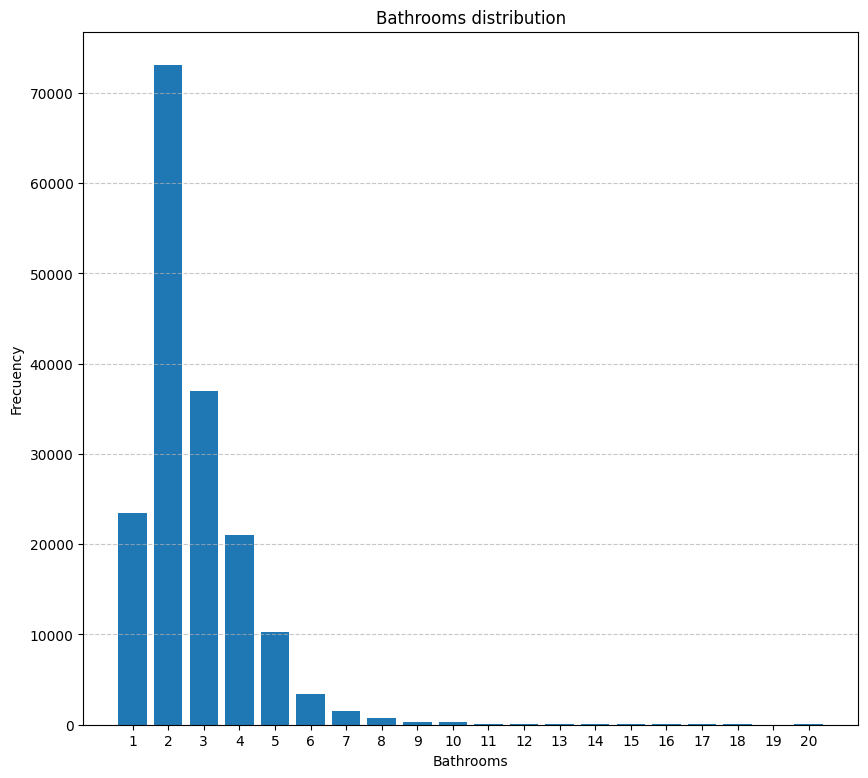

In [28]:
bathrooms_Count = df['bathrooms'].value_counts().sort_index()

# Plot
plt.figure(figsize=(10, 9))
plt.bar(bathrooms_Count.index, bathrooms_Count.values)
plt.xlabel('Bathrooms')
plt.ylabel('Frecuency')
plt.title('Bathrooms distribution')
plt.xticks(range(1, 21))
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()

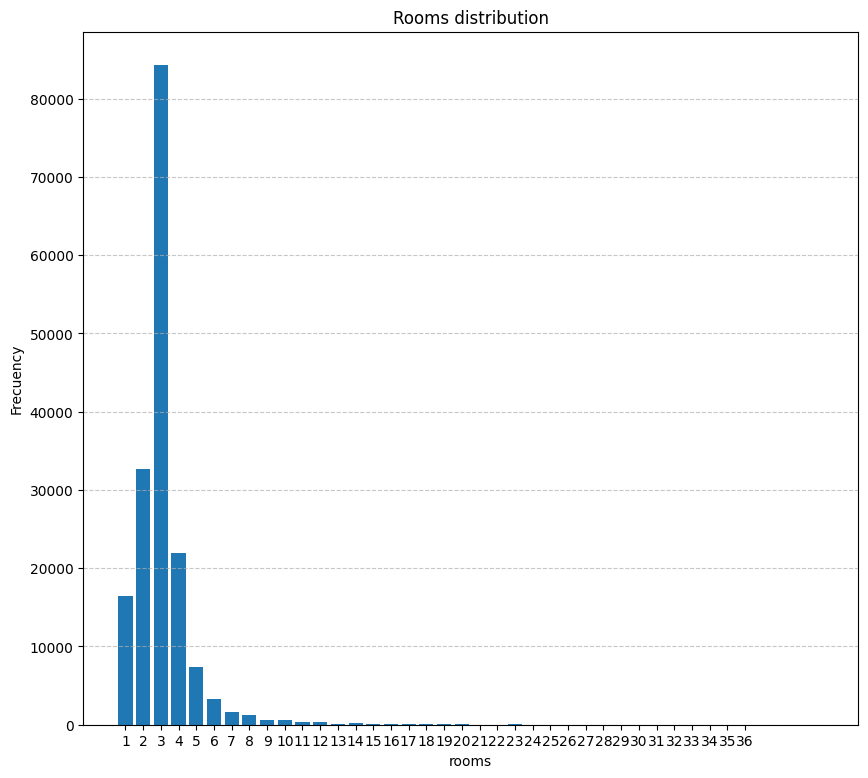

In [29]:
rooms_Count = df['rooms'].value_counts().sort_index()

# Plot
plt.figure(figsize=(10, 9))
plt.bar(rooms_Count.index, rooms_Count.values)
plt.xlabel('rooms')
plt.ylabel('Frecuency')
plt.title('Rooms distribution')
# plt.yscale('log')
plt.xticks(range(1, len(rooms_Count.index + 1)))
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()

Distribución de baños y habitaciones teniendo en cuenta el tipo de propiedad

In [30]:
df.hvplot.scatter(x='bedrooms', y='bathrooms', by='property_type')

:NdOverlay   [property_type]
   :Scatter   [bedrooms]   (bathrooms)

Distribución de baños y habitaciones teniendo en cuenta el precio (la columna ['price'] se dividió por $10^6$ para disminuir la cantidad de ceros, por lo que quedó en unidades de millones)

In [31]:
df.hvplot.scatter(x='bedrooms', y='bathrooms', c='price')

:Scatter   [bedrooms]   (bathrooms,price)

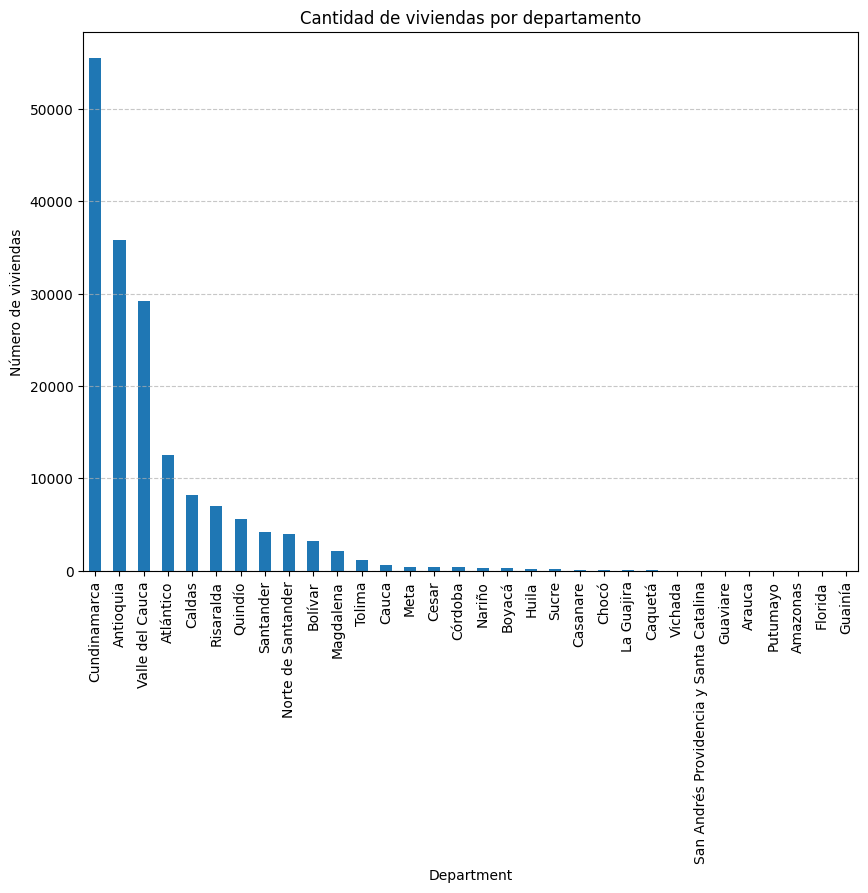

In [32]:
# Plot
plt.figure(figsize=(10, 7))
df['Department'].value_counts().plot(kind='bar')
plt.xlabel('Department')
plt.ylabel('Número de viviendas')
plt.title('Cantidad de viviendas por departamento')
plt.grid(axis='y', linestyle='--', alpha=0.7)
# Rotar las etiquetas del eje x 90 grados
plt.xticks(rotation=90)
plt.show()

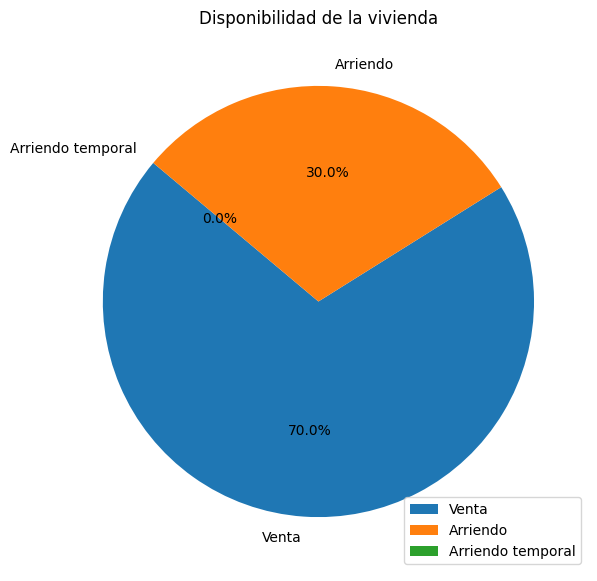

In [33]:
# Plot
plt.figure(figsize=(10, 7))
plt.pie(df['operation_type'].value_counts(), labels=df['operation_type'].value_counts().index, autopct='%1.1f%%', startangle=140)
plt.title('Disponibilidad de la vivienda')
plt.legend(loc='lower right')
plt.grid()
plt.show()

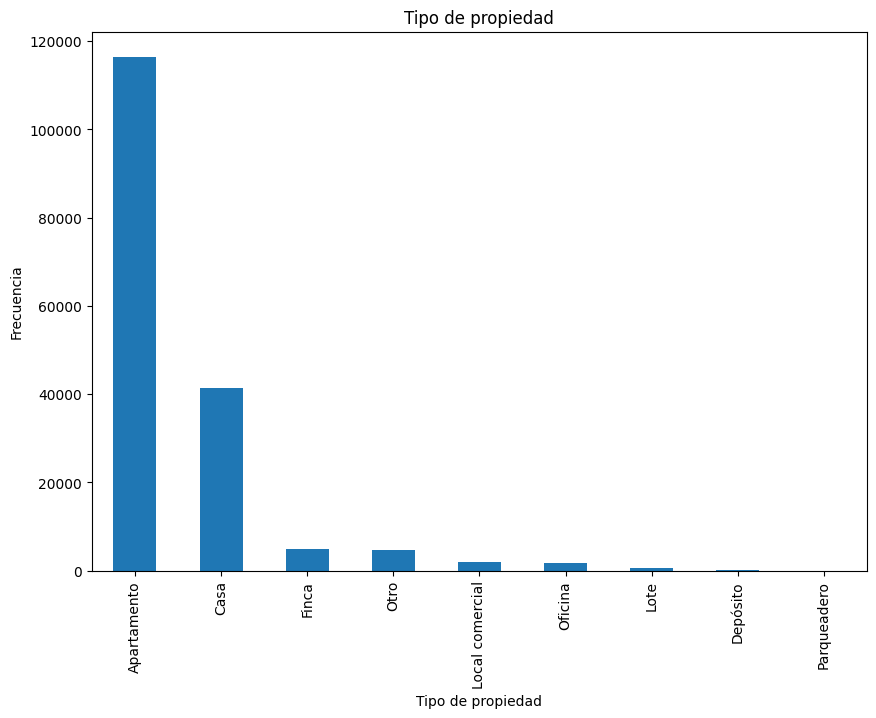

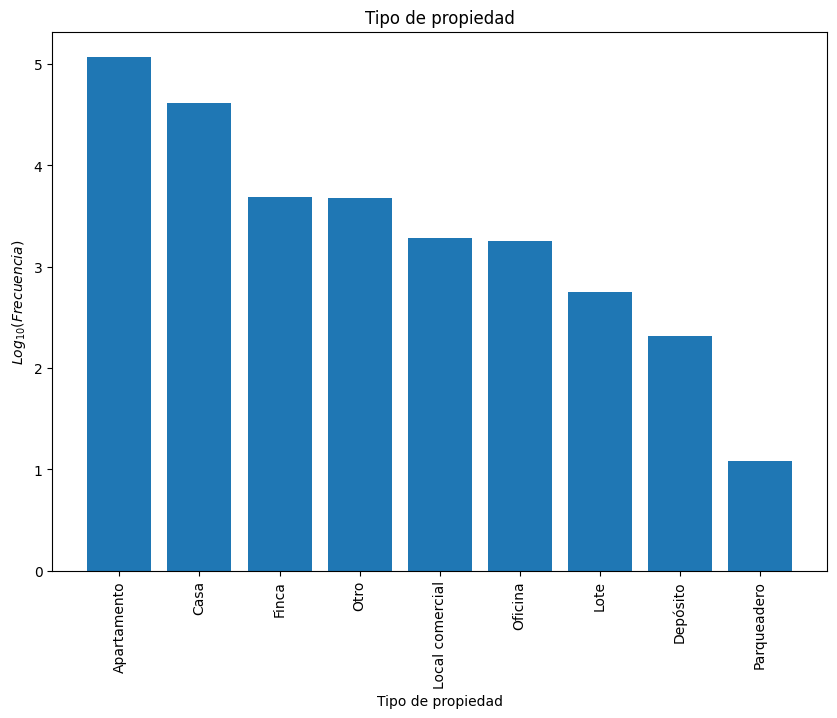

In [34]:
# Plot
plt.figure(figsize=(10, 7))
df['property_type'].value_counts().plot(kind='bar')
plt.xlabel('Tipo de propiedad')
plt.ylabel('Frecuencia')
plt.title('Tipo de propiedad')
plt.xticks(rotation=90)
plt.show()

# Plot
plt.figure(figsize=(10, 7))
plt.bar(df['property_type'].value_counts().index,
        np.log10(df['property_type'].value_counts().values))
plt.xlabel('Tipo de propiedad')
plt.ylabel('$Log_{10}(Frecuencia)$')
plt.title('Tipo de propiedad')
plt.xticks(rotation=90)
plt.show()

In [35]:
df["price"].hvplot.hist(bins=30, title="Price distribution")

:Histogram   [price]   (Count)

Correlación entre la variable a predecir ```´price´``` y las demás variables. Para conocer cuál variable tiene mayor peso en el comportamiento del precio.

In [36]:
df_venta = df.loc[df['operation_type'] == 'Venta']
df_arriendo = df.loc[df['operation_type'] == 'Arriendo']

In [37]:
df_venta["price"].hvplot.hist(bins=30, normed=True, title="Sale price distribution")

:Histogram   [price]   (Frequency)

In [38]:
df_arriendo["price"].hvplot.hist(bins=150, normed=True, title="Rent price distribution")

:Histogram   [price]   (Frequency)

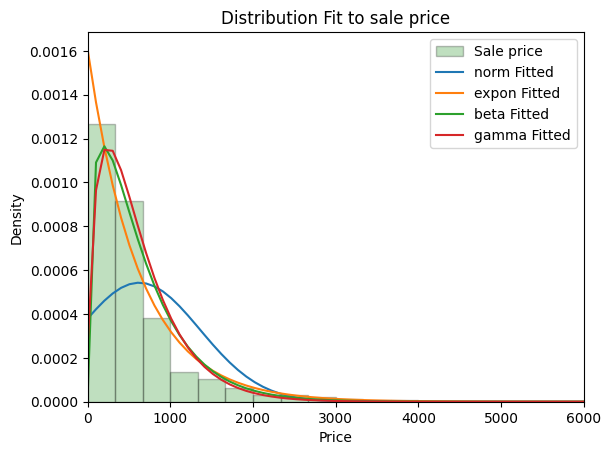

{'norm': {'param': (np.float64(623.168561303013), np.float64(735.0400436775016)), 'D': np.float64(0.22592413576048473), 'p_value': np.float64(0.0)}, 'expon': {'param': (0.135, 623.033561303013), 'D': np.float64(0.1443281524936017), 'p_value': np.float64(0.0)}, 'beta': {'param': (np.float64(1.426163053822366), np.float64(222992.1678737396), np.float64(0.1234714512167035), np.float64(97961757.04853137)), 'D': np.float64(0.116953654164422), 'p_value': np.float64(0.0)}, 'gamma': {'param': (np.float64(1.7051098169505141), np.float64(-11.722964233228963), np.float64(365.4807586935641)), 'D': np.float64(0.126251333485356), 'p_value': np.float64(0.0)}}


In [39]:
y_data = df_venta["price"]

# Fit the distributions
distribuciones = [stats.norm, stats.expon, stats.beta, stats.gamma]  # Some common distributions

# Fitting n test distributions to the data
def ajustar_y_comparar(y_data, distribuciones):
    plt.figure()
    plt.hist(y_data, bins=30, density=True, alpha=0.25, color='g', label='Sale price', edgecolor='black')

    mejores_dist = {}
    for dist in distribuciones:
        param = dist.fit(y_data)  # Fit distribution
        pdf_fitted = dist.pdf(np.linspace(min(y_data), max(y_data), 100), *param)  # Fitting PDF
        plt.plot(np.linspace(min(y_data), max(y_data), 100), pdf_fitted, label=f'{dist.name} Fitted')

        # Calcular la bondad de ajuste utilizando la prueba de Kolmogorov-Smirnov
        D, p_value = stats.kstest(y_data, dist.name, args=param)
        mejores_dist[dist.name] = {'param': param, 'D': D, 'p_value': p_value}

    plt.legend(loc='best')
    plt.title('Distribution Fit to sale price')
    plt.xlabel('Price')
    plt.ylabel('Density')
    plt.xlim(0, 6000)

    plt.show()

    return mejores_dist

# Ejecutar el ajuste y la comparación
mejores_dist = ajustar_y_comparar(y_data, distribuciones)
print(mejores_dist)

In [40]:
df_arriendo.sort_values(by='rooms', ascending=False)

,lat,lon,Department,City,rooms,bedrooms,bathrooms,surface_total,price,property_type,operation_type
42952,4.689000,-74.056000,Cundinamarca,Bogotá D.C,40.0,40.0,2.0,300.0,24.00,Oficina,Arriendo
101481,4.683000,-74.058000,Cundinamarca,Bogotá D.C,40.0,40.0,14.0,300.0,30.00,Otro,Arriendo
101483,4.683000,-74.058000,Cundinamarca,Bogotá D.C,40.0,40.0,14.0,200.0,30.00,Oficina,Arriendo
53554,3.461445,-76.532772,Valle del Cauca,Cali,36.0,36.0,20.0,600.0,30.00,Otro,Arriendo
102361,3.470000,-76.506000,Valle del Cauca,Cali,30.0,30.0,15.0,1200.0,35.00,Otro,Arriendo
...,...,...,...,...,...,...,...,...,...,...,...
171759,4.665000,-74.046000,Cundinamarca,Bogotá D.C,1.0,1.0,1.0,23.0,1.35,Apartamento,Arriendo
171762,4.675000,-74.052000,Cundinamarca,Bogotá D.C,1.0,1.0,1.0,48.0,2.30,Apartamento,Arriendo
171779,4.680000,-74.051000,Cundinamarca,Bogotá D.C,1.0,1.0,1.0,70.0,2.50,Apartamento,Arriendo
171815,4.679000,-74.055000,Cundinamarca,Bogotá D.C,1.0,1.0,2.0,66.0,3.10,Apartamento,Arriendo


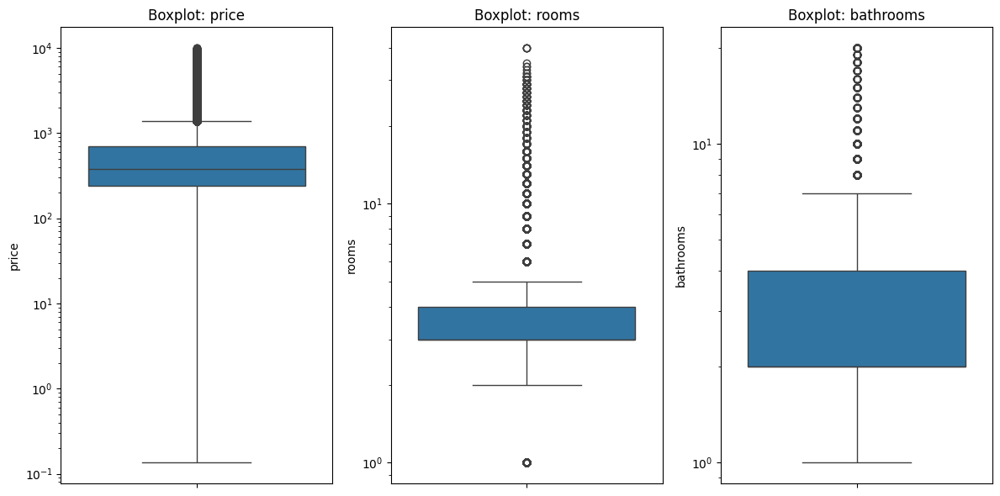

In [41]:
import seaborn as sns
import matplotlib.pyplot as plt

# Lista de columnas numéricas a analizar
columnas = ['price', 'rooms', 'bathrooms']

# Boxplots
plt.figure(figsize=(12, 6))
for i, col in enumerate(columnas):
    plt.subplot(1, 3, i+1)
    sns.boxplot(y=df_venta[col])
    plt.title(f'Boxplot: {col}')
    plt.yscale('log')
plt.tight_layout()
plt.show()

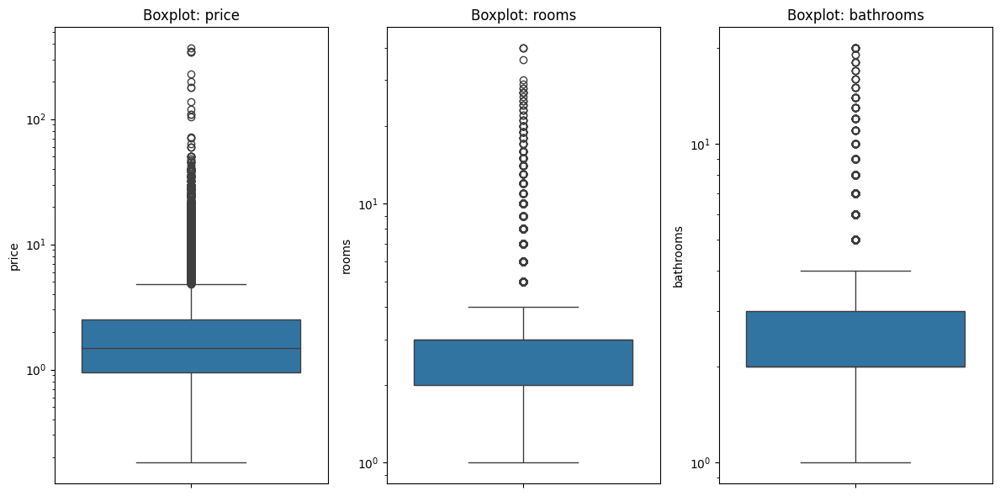

In [42]:
import seaborn as sns
import matplotlib.pyplot as plt

# Lista de columnas numéricas a analizar
columnas = ['price', 'rooms', 'bathrooms']

# Boxplots
plt.figure(figsize=(12, 6))
for i, col in enumerate(columnas):
    plt.subplot(1, 3, i+1)
    sns.boxplot(y=df_arriendo[col])
    plt.title(f'Boxplot: {col}')
    plt.yscale('log')
plt.tight_layout()
plt.show()

In [43]:
Q1_price = df_venta['price'].quantile(0.25)
Q3_price = df_venta['price'].quantile(0.75)
IQR_price = Q3_price - Q1_price
outliers_price = df_venta[(df_venta['price'] < Q1_price - 1.5 * IQR_price) | (df_venta['price'] > Q3_price + 1.5 * IQR_price)]
outliers_price[outliers_price['price'] > 5000]

,lat,lon,Department,City,rooms,bedrooms,bathrooms,surface_total,price,property_type,operation_type
692,4.661000,-74.053000,Cundinamarca,Bogotá D.C,10.0,10.0,12.0,173.0,6500.0,Casa,Venta
2326,4.345971,-75.847749,Valle del Cauca,Cali,6.0,6.0,4.0,260.0,5100.0,Otro,Venta
2333,4.961667,-74.163594,Cundinamarca,Subachoque,12.0,12.0,12.0,273.0,9800.0,Otro,Venta
2859,4.865313,-74.024184,Cundinamarca,Chía,5.0,5.0,5.0,72.0,5600.0,Casa,Venta
3015,4.659464,-74.047408,Cundinamarca,Bogotá D.C,3.0,3.0,3.0,3650.0,7000.0,Apartamento,Venta
...,...,...,...,...,...,...,...,...,...,...,...
171663,4.662000,-74.046000,Cundinamarca,Bogotá D.C,5.0,5.0,6.0,425.0,5500.0,Apartamento,Venta
171685,4.673000,-74.043000,Cundinamarca,Bogotá D.C,4.0,4.0,6.0,250.0,6300.0,Apartamento,Venta
171760,4.660000,-74.047000,Cundinamarca,Bogotá D.C,3.0,3.0,4.0,363.0,5100.0,Apartamento,Venta
171772,4.661000,-74.047000,Cundinamarca,Bogotá D.C,3.0,3.0,4.0,55.0,6000.0,Apartamento,Venta


Los valores detectados como "atípicos" en la columna de precios de las propiedades en venta y alquiler no serán reemplazados por estadísticas como la media o la mediana, ya que sitios como Finca Raíz https://www.metrocuadrado.com/apartamentos/venta/bogota/chico-parque-de-la-93/  confirman que el mercado maneja estos precios.

In [44]:
Q1_rent = df_arriendo['price'].quantile(0.25)
Q3_rent = df_arriendo['price'].quantile(0.75)
IQR_rent = Q3_rent - Q1_rent
outliers_rent = df_arriendo[(df_arriendo['price'] < Q1_rent - 1.5 * IQR_rent) | (df_arriendo['price'] > Q3_rent + 1.5 * IQR_rent)]
outliers_rent.sort_values(by='price', ascending=False)

,lat,lon,Department,City,rooms,bedrooms,bathrooms,surface_total,price,property_type,operation_type
104548,6.143397,-75.616715,Antioquia,Sabaneta,1.0,3.0,2.0,80.0,370.00,Apartamento,Arriendo
118962,3.432567,-76.542154,Valle del Cauca,Cali,3.0,3.0,3.0,68.0,350.00,Oficina,Arriendo
3749,7.892512,-72.491226,Norte de Santander,Villa del Rosario,4.0,4.0,2.0,225.0,340.00,Apartamento,Arriendo
168245,7.892512,-72.491226,Norte de Santander,Villa del Rosario,4.0,4.0,4.0,1856.0,340.00,Apartamento,Arriendo
114387,4.429000,-75.188000,Tolima,Ibagué,5.0,5.0,3.0,84.0,230.00,Casa,Arriendo
...,...,...,...,...,...,...,...,...,...,...,...
30066,4.807211,-75.690631,Risaralda,Marsella,8.0,8.0,3.0,72.0,4.85,Local comercial,Arriendo
5251,4.714724,-74.031389,Cundinamarca,Bogotá D.C,3.0,3.0,2.0,96.0,4.85,Apartamento,Arriendo
35123,10.400000,-75.555000,Bolívar,Cartagena,3.0,3.0,4.0,272.0,4.85,Apartamento,Arriendo
109812,4.691298,-74.041900,Cundinamarca,Bogotá D.C,3.0,3.0,2.0,93.0,4.85,Apartamento,Arriendo


In [45]:
# === Transformaciones y dummies geográficas (Econometría) ===


import numpy as np

df = df.copy()

# 1. Eliminar observaciones problemáticas para logs
df = df[df['price'] > 0]
if 'surface_total' in df.columns:
    df = df[df['surface_total'] > 0]
else:
    print(" No encontré 'surface_total'.")

# 2. Variables en log
df['log_price'] = np.log(df['price'])
if 'surface_total' in df.columns:
    df['log_surface_total'] = np.log(df['surface_total'])

# 3. Limpieza rápida de nombres de ciudades
df['City'] = df['City'].astype(str).str.strip()

# 4. Dummies geográficas
big3 = {'Medellín', 'Bogotá D.C', 'Cali'} 
df['is_medellin'] = (df['City'] == 'Medellín').astype(int)
df['is_big3']     = df['City'].isin(big3).astype(int)

# 5. Chequeos rápidos
print("Tipos de property_type encontrados:")
print(df['property_type'].value_counts())

print("\nEjemplo de ciudades (primeros 20 valores únicos):")
print(df['City'].dropna().unique()[:20])

Tipos de property_type encontrados:
property_type
Apartamento        116361
Casa                41402
Finca                4833
Otro                 4737
Local comercial      1927
Oficina              1771
Lote                  558
Depósito              205
Parqueadero            12
Name: count, dtype: int64

Ejemplo de ciudades (primeros 20 valores únicos):
['Pereira' 'Armenia' 'Marsella' 'Santa Marta' 'Santa Ana' 'Bogotá D.C'
 'Villa del Rosario' 'Manizales' 'Cali' 'Sabaneta' 'Los Patios' 'Melgar'
 'Medellín' 'Bello' 'Chía' 'Sopó' 'Palmira' 'Envigado' 'Jamundí'
 'Cartagena']


In [46]:
# === BLOQUE 2: Filtrado por tipo de propiedad ===

tipos_usar = ['Apartamento', 'Casa']  # puedes agregar más si quieres

dfs_tipo = {}
for t in tipos_usar:
    sub = df[df['property_type'] == t].copy()
    if len(sub) < 50:
        print(f" Ojo: '{t}' tiene pocas observaciones ({len(sub)})")
    dfs_tipo[t] = sub

print("Subsets creados:", list(dfs_tipo.keys()))
for k, v in dfs_tipo.items():
    print(k, v.shape)

Subsets creados: ['Apartamento', 'Casa']
Apartamento (116361, 15)
Casa (41402, 15)


In [47]:
# Paso 1: Chequear NaN en variables clave
cols_chk = ['log_price','log_surface_total','rooms','bathrooms','is_medellin','is_big3']
for k, sdf in dfs_tipo.items():
    print(f"\n== {k} ==")
    if not set(cols_chk).issubset(sdf.columns):
        print("Faltan columnas:", set(cols_chk) - set(sdf.columns))
    else:
        print("NaN por columna:\n", sdf[cols_chk].isna().sum())


== Apartamento ==
NaN por columna:
 log_price            0
log_surface_total    0
rooms                0
bathrooms            0
is_medellin          0
is_big3              0
dtype: int64

== Casa ==
NaN por columna:
 log_price            0
log_surface_total    0
rooms                0
bathrooms            0
is_medellin          0
is_big3              0
dtype: int64


In [48]:
# Paso 3: Modelos OLS

import statsmodels.formula.api as smf

posibles_regs = ['log_surface_total', 'rooms', 'bathrooms']
regresores = [r for r in posibles_regs if r in df.columns]

def crear_formula(dummy_geo):
    rhs = " + ".join(regresores + [dummy_geo])
    return f"log_price ~ {rhs}"

formula_med  = crear_formula('is_medellin')
formula_big3 = crear_formula('is_big3')

def run_ols_simple(df_sub, formula, nombre_modelo):
    model = smf.ols(formula=formula, data=df_sub).fit(cov_type="HC3")
    print(f"\n===== {nombre_modelo} =====")
    print(model.summary())
    return model

resultados = []
for t, subdf in dfs_tipo.items():
    m_a = run_ols_simple(subdf, formula_med,  f"{t} | Medellín vs resto")
    resultados.append(("Medellín vs resto", t, m_a))
    m_b = run_ols_simple(subdf, formula_big3, f"{t} | Big3 (Med+Bogotá D.C+Cali) vs resto")
    resultados.append(("Big3 vs resto", t, m_b))


===== Apartamento | Medellín vs resto =====
                            OLS Regression Results                            
Dep. Variable:              log_price   R-squared:                       0.078
Model:                            OLS   Adj. R-squared:                  0.078
Method:                 Least Squares   F-statistic:                     1404.
Date:                Tue, 22 Jul 2025   Prob (F-statistic):               0.00
Time:                        23:19:33   Log-Likelihood:            -2.7680e+05
No. Observations:              116361   AIC:                         5.536e+05
Df Residuals:                  116356   BIC:                         5.537e+05
Df Model:                           4                                         
Covariance Type:                  HC3                                         
                        coef    std err          z      P>|z|      [0.025      0.975]
-------------------------------------------------------------------------------

In [75]:
# === Tests de diagnóstico (BP, RESET, VIF) ===

from statsmodels.stats.diagnostic import het_breuschpagan, linear_reset
from statsmodels.stats.outliers_influence import variance_inflation_factor
import statsmodels.api as sm
import pandas as pd

def breusch_pagan_test(model):
    """Breusch–Pagan para heterocedasticidad."""
    resid = model.resid
    exog  = model.model.exog  # incluye constante
    lm_stat, lm_pvalue, f_stat, f_pvalue = het_breuschpagan(resid, exog)
    return {"LM stat": lm_stat, "LM p-value": lm_pvalue,
            "F stat": f_stat, "F p-value": f_pvalue}

def reset_test(model, power=2):
    """Ramsey RESET para especificación funcional."""
    res = linear_reset(model, power=power, use_f=True)
    return {"F stat": res.fvalue, "p-value": res.pvalue}

def vif_table(model):
    """Tabla VIF para los regresores (excluye la constante si existe)."""
    exog = pd.DataFrame(model.model.exog, columns=model.model.exog_names)
    if 'Intercept' in exog.columns:
        exog = exog.drop(columns=['Intercept'])
    vif = pd.DataFrame({
        "variable": exog.columns,
        "VIF": [variance_inflation_factor(exog.values, i) for i in range(exog.shape[1])]
    })
    return vif

# Ejecutar diagnósticos para cada modelo
diag_rows = []
vif_dict  = {}

for corte, tipo, m in resultados:
    bp  = breusch_pagan_test(m)
    rs  = reset_test(m, power=2)
    diag_rows.append({
        "Modelo": f"{tipo} | {corte}",
        "BP LM p-value": bp["LM p-value"],
        "RESET p-value": rs["p-value"],
        "R2": m.rsquared
    })
    vif_dict[f"{tipo} | {corte}"] = vif_table(m)

diagnosticos = pd.DataFrame(diag_rows)

print("\n=== Diagnósticos básicos ===")
display(diagnosticos)

print("\n=== VIF por modelo ===")
for nombre, tab in vif_dict.items():
    print(f"\n-- {nombre} --")
    display(tab)


=== Diagnósticos básicos ===


,Modelo,BP LM p-value,RESET p-value,R2
0,Apartamento | Medellín vs resto,1.000976e-192,8.228600e-239,0.078106
1,Apartamento | Big3 vs resto,4.519424e-213,3.054034e-219,0.089210
2,Casa | Medellín vs resto,1.714842e-78,1.056369e-87,0.048347
3,Casa | Big3 vs resto,1.343555e-64,1.994897e-85,0.049745



=== VIF por modelo ===

-- Apartamento | Medellín vs resto --


,variable,VIF
0,log_surface_total,12.421726
1,rooms,15.539450
2,bathrooms,8.892112
3,is_medellin,1.156039



-- Apartamento | Big3 vs resto --


,variable,VIF
0,log_surface_total,13.427573
1,rooms,15.530753
2,bathrooms,8.955775
3,is_big3,2.353663



-- Casa | Medellín vs resto --


,variable,VIF
0,log_surface_total,6.391047
1,rooms,8.365698
2,bathrooms,7.921743
3,is_medellin,1.075473



-- Casa | Big3 vs resto --


,variable,VIF
0,log_surface_total,6.488072
1,rooms,8.569957
2,bathrooms,7.924619
3,is_big3,1.807016


,Modelo,Variable,Coef,EE robusta,p-value,IC 95% (inf),IC 95% (sup),Efecto % ≈ (e^β−1)*100
3,Apartamento | Medellín vs resto,Baños,0.3602,0.0103,0.0000,0.3401,0.3803,43.3610
0,Apartamento | Medellín vs resto,Dummy Medellín,0.0861,0.0224,0.0001,0.0423,0.1300,8.9929
2,Apartamento | Medellín vs resto,Habitaciones,0.4773,0.0189,0.0000,0.4402,0.5144,61.1708
1,Apartamento | Medellín vs resto,log(Superficie),0.1378,0.0113,0.0000,0.1156,0.1599,14.7713
7,Apartamento | Big3 vs resto,Baños,0.3360,0.0103,0.0000,0.3158,0.3562,39.9396
4,Apartamento | Big3 vs resto,Dummy Big3,0.5870,0.0156,0.0000,0.5565,0.6176,79.8631
6,Apartamento | Big3 vs resto,Habitaciones,0.4967,0.0192,0.0000,0.4589,0.5344,64.3225
5,Apartamento | Big3 vs resto,log(Superficie),0.1332,0.0113,0.0000,0.1111,0.1552,14.2435
11,Casa | Medellín vs resto,Baños,0.1711,0.0074,0.0000,0.1565,0.1856,18.6557
8,Casa | Medellín vs resto,Dummy Medellín,-0.1598,0.0452,0.0004,-0.2485,-0.0712,-14.7727


Tabla guardada en 'tabla_comparativa_modelos.csv'


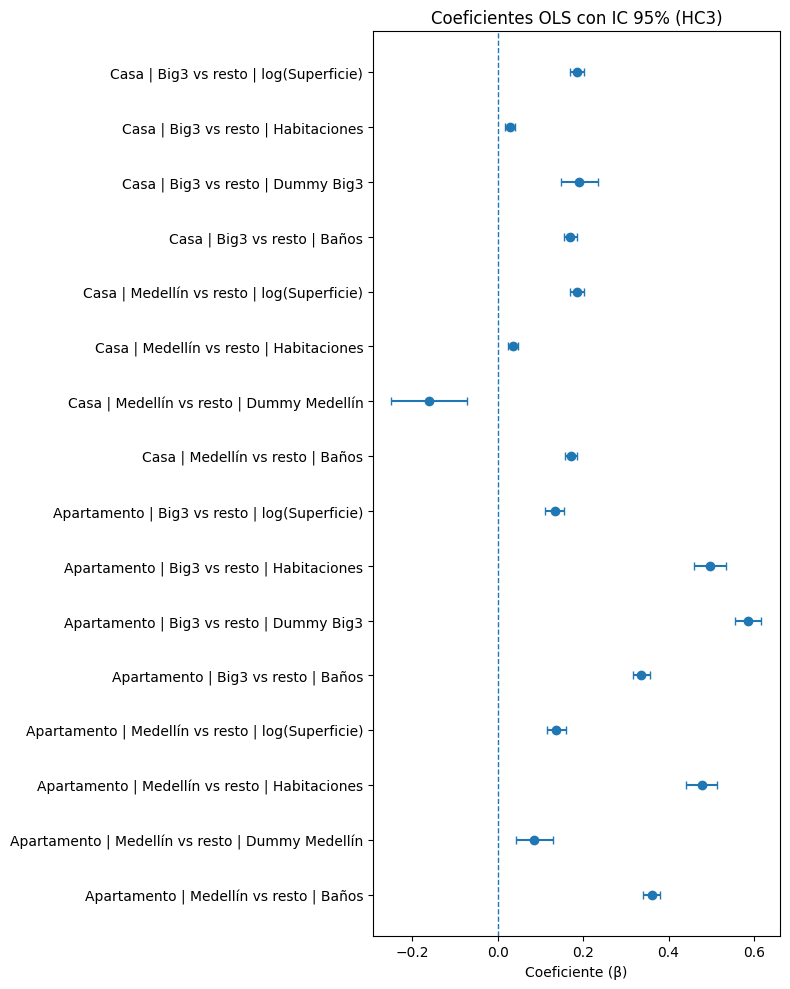

In [79]:
# === BLOQUE 5: Tabla comparativa + gráfico de coeficientes ===
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# 1. Construir tabla con coeficientes clave
vars_interes = ['is_medellin','is_big3','log_surface_total','rooms','bathrooms']

def nice_name(v):
    return {
        'is_medellin':'Dummy Medellín',
        'is_big3':'Dummy Big3',
        'log_surface_total':'log(Superficie)',
        'rooms':'Habitaciones',
        'bathrooms':'Baños'
    }.get(v, v)

rows = []
for corte, tipo, m in resultados:
    for v in vars_interes:
        if v in m.params.index:
            beta = m.params[v]
            se   = m.bse[v]
            pval = m.pvalues[v]
            lo, hi = m.conf_int().loc[v]
            pct = np.exp(beta) - 1  # efecto porcentual aprox.
            rows.append({
                'Modelo': f"{tipo} | {corte}",
                'Variable': nice_name(v),
                'Coef': beta,
                'EE robusta': se,
                'p-value': pval,
                'IC 95% (inf)': lo,
                'IC 95% (sup)': hi,
                'Efecto % ≈ (e^β−1)*100': pct*100
            })

tabla_comp = pd.DataFrame(rows)

# Orden (opcional)
orden_modelos = [
    'Apartamento | Medellín vs resto',
    'Apartamento | Big3 vs resto',
    'Casa | Medellín vs resto',
    'Casa | Big3 vs resto'
]
tabla_comp['Modelo'] = pd.Categorical(tabla_comp['Modelo'], categories=orden_modelos, ordered=True)
tabla_comp = tabla_comp.sort_values(['Modelo','Variable'])

# Mostrar tabla
pd.set_option('display.float_format', lambda x: f"{x:0.4f}")
display(tabla_comp)

# Guardar CSV (opcional)
tabla_comp.to_csv('tabla_comparativa_modelos.csv', index=False)
print("Tabla guardada en 'tabla_comparativa_modelos.csv'")

# 2. Gráfico de coeficientes (con IC 95%)
#    - Un solo gráfico con cada fila = Modelo-Variable
#    - Eje X = Coeficiente (beta), barras de error = IC 95%

plot_df = tabla_comp.copy()
plot_df['label'] = plot_df['Modelo'].astype(str) + " | " + plot_df['Variable']

fig, ax = plt.subplots(figsize=(8, 10))
y_pos = np.arange(len(plot_df))

ax.errorbar(
    x=plot_df['Coef'],
    y=y_pos,
    xerr=[plot_df['Coef'] - plot_df['IC 95% (inf)'], plot_df['IC 95% (sup)'] - plot_df['Coef']],
    fmt='o', capsize=3
)

ax.axvline(0, linestyle='--', linewidth=1)
ax.set_yticks(y_pos)
ax.set_yticklabels(plot_df['label'])
ax.set_xlabel('Coeficiente (β)')
ax.set_title('Coeficientes OLS con IC 95% (HC3)')
plt.tight_layout()
plt.show()

## Modelos predictorios

Las variables con las que vamos a predecir el precio tanto para arriendo como para propiedades en venta son:

```
x = ['lat', 'lon', 'Department', 'City', 'rooms', 'bedrooms',
    'bathrooms', 'surface_total, 'property_type']
```
y nuestro <span style="color:red;">target</span>

```
y = ['price']
```

### Precios de venta

In [49]:
df_venta.info()

<class 'pandas.core.frame.DataFrame'>
Index: 120282 entries, 0 to 171946
Data columns (total 11 columns):
 #   Column          Non-Null Count   Dtype  
---  ------          --------------   -----  
 0   lat             120282 non-null  float64
 1   lon             120282 non-null  float64
 2   Department      120282 non-null  object 
 3   City            120282 non-null  object 
 4   rooms           120282 non-null  float64
 5   bedrooms        120282 non-null  float64
 6   bathrooms       120282 non-null  float64
 7   surface_total   120282 non-null  float64
 8   price           120282 non-null  float64
 9   property_type   120282 non-null  object 
 10  operation_type  120282 non-null  object 
dtypes: float64(7), object(4)
memory usage: 11.0+ MB


In [50]:
X_Sale_Full = df_venta.copy()
Y_Sale = X_Sale_Full['price']
X_Sale_Full = X_Sale_Full.drop(['price', 'operation_type'], axis=1)

In [51]:
X_train_S, X_val_S, y_train_S, y_val_S = train_test_split(X_Sale_Full, Y_Sale, test_size=0.2, random_state=42)

In [52]:
features_cat = ['City', 'Department', 'property_type']
features_num = [col for col in X_Sale_Full.columns if col not in features_cat]

preprocessor = ColumnTransformer(
    transformers=[
        ('num', MinMaxScaler(), features_num),
        ('cat', OneHotEncoder(handle_unknown='ignore'), features_cat)
    ]
)

In [53]:
scaler_y = MinMaxScaler()
y_train_scaled_S = scaler_y.fit_transform(y_train_S.values.reshape(-1, 1))
y_val_scaled_S = scaler_y.transform(y_val_S.values.reshape(-1, 1))

In [54]:
mae_scores_S = []
estimators_range = [2, 5, 10] # range(10, 200, 60)

In [55]:
for n in estimators_range:
    model = Pipeline(steps=[
        ('preprocessor', preprocessor),
        ('regressor', RandomForestRegressor(n_estimators=n, random_state=42))
    ])
    model.fit(X_train_S, y_train_scaled_S)
    y_pred_S = model.predict(X_val_S)
    mae_S = mean_absolute_error(y_val_scaled_S, y_pred_S)
    mae_scores_S.append(mae_S)

c:\Users\User\Downloads\Trabajo_econometria\tf-env\lib\site-packages\sklearn\base.py:1363: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
c:\Users\User\Downloads\Trabajo_econometria\tf-env\lib\site-packages\sklearn\base.py:1363: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
c:\Users\User\Downloads\Trabajo_econometria\tf-env\lib\site-packages\sklearn\base.py:1363: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


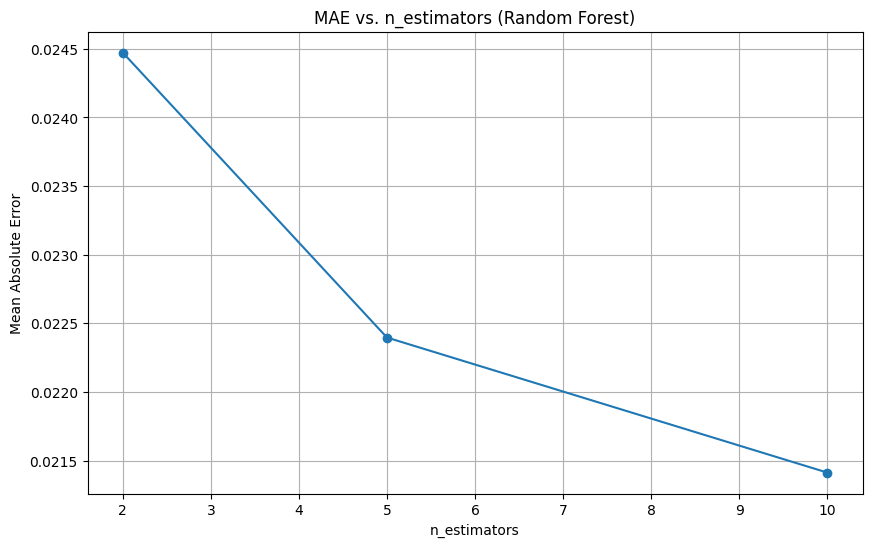

In [56]:
plt.figure(figsize=(10, 6))
plt.plot(estimators_range, mae_scores_S, marker='o')
plt.xlabel('n_estimators')
plt.ylabel('Mean Absolute Error')
plt.title('MAE vs. n_estimators (Random Forest)')
plt.grid(True)
plt.show()

In [57]:
y_val_scaled_S, y_pred_S

(array([[0.02848688],
        [0.08498765],
        [0.01598672],
        ...,
        [0.28999041],
        [0.01348668],
        [0.01348668]]),
 array([0.02850288, 0.1705888 , 0.01134665, ..., 0.11918811, 0.04038705,
        0.01540171]))

In [58]:
y_pred_orig = scaler_y.inverse_transform(y_pred_S.reshape(-1, 1))
y_val_orig = scaler_y.inverse_transform(y_val_scaled_S.reshape(-1, 1))

In [59]:
y_val_orig, y_pred_orig

(array([[ 285.],
        [ 850.],
        [ 160.],
        ...,
        [2900.],
        [ 135.],
        [ 135.]]),
 array([[ 285.16],
        [1706.  ],
        [ 113.6 ],
        ...,
        [1192.  ],
        [ 404.  ],
        [ 154.15]]))

### Neuronal network

In [60]:
features_cat = ['Department', 'City', 'property_type']

preprocessor = make_column_transformer(
    (OneHotEncoder(handle_unknown='ignore'), features_cat)
)


X_train_S_Norm = preprocessor.fit_transform(X_train_S)
X_test_S_Norm = preprocessor.transform(X_val_S)

input_shape = [X_train_S_Norm.shape[1]]
print("Input shape: {}".format(input_shape))

Input shape: [261]


c:\Users\User\Downloads\Trabajo_econometria\tf-env\lib\site-packages\keras\src\layers\core\dense.py:93: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Best Validation Loss: 0.0045


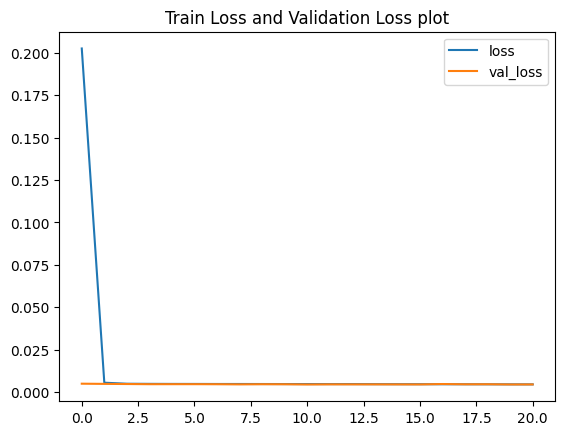

In [61]:
# Model
model = keras.Sequential([
    layers.Dense(256, activation='relu', input_shape=input_shape),   # Layer 1
    layers.Dropout(0.3),

    layers.BatchNormalization(),
    layers.Dense(256, activation='relu'),   # Layer 2
    layers.Dropout(0.3),

    layers.BatchNormalization(),
    layers.Dense(128, activation='relu'),    # Layer 3
    layers.Dropout(0.3),

    layers.BatchNormalization(),
    layers.Dense(1),    # Layer output
])

model.compile(
    optimizer='adam',
    loss='mse',  # o 'mae'
    metrics=['mae']  # o 'mse'
)

early_stopping = keras.callbacks.EarlyStopping(
    patience=10,
    min_delta=0.00001,
    restore_best_weights=True,
)

# Fit model
history = model.fit(
    X_train_S_Norm, y_train_scaled_S,
    validation_data=(X_test_S_Norm, y_val_scaled_S),
    batch_size=212,
    epochs=1000,
    callbacks=[early_stopping],
    verbose=0, # hide the output because we have so many epochs
)

# Show the learning curves
history_df = pd.DataFrame(history.history)
history_df.loc[:, ['loss', 'val_loss']].plot();
plt.title('Train Loss and Validation Loss plot')

print("Best Validation Loss: {:0.4f}".format(history_df['val_loss'].min()))

In [62]:
y_pred_scaled = model.predict(X_test_S_Norm)
y_pred = scaler_y.inverse_transform(y_pred_scaled)
y_real = scaler_y.inverse_transform(y_val_scaled_S)

# show the first 5 predictions vs real values
for i in range(5):
    print(f"Predicción: {y_pred[i]} — Real: {y_real[i]}")

752/752 ━━━━━━━━━━━━━━━━━━━━ 1s 723us/step
Predicción: [419.62402] — Real: [285.]
Predicción: [729.2865] — Real: [850.]
Predicción: [996.5917] — Real: [160.]
Predicción: [996.5917] — Real: [320.]
Predicción: [1200.5332] — Real: [360.]


c:\Users\User\Downloads\Trabajo_econometria\tf-env\lib\site-packages\keras\src\layers\core\dense.py:93: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Best Validation Loss: 0.0045


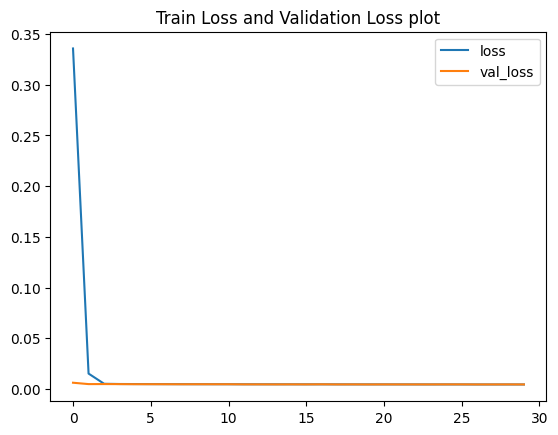

In [63]:
# Model
model = keras.Sequential([
    layers.Dense(100, activation='relu', input_shape=input_shape),   # Layer 1
    layers.BatchNormalization(),
    layers.Dropout(0.3),

    layers.Dense(50, activation='relu'),   # Layer 2
    layers.BatchNormalization(),
    layers.Dropout(0.3),

    layers.Dense(1),    # Layer output
])

model.compile(
    optimizer='adam',
    loss='mse',  # o 'mae'
    metrics=['mae']  # o 'mse'
)

early_stopping = keras.callbacks.EarlyStopping(
    patience=10,
    min_delta=0.00001,
    restore_best_weights=True,
)

# Fit model
history = model.fit(
    X_train_S_Norm, y_train_scaled_S,
    validation_data=(X_test_S_Norm, y_val_scaled_S),
    batch_size=212,
    epochs=1000,
    callbacks=[early_stopping],
    verbose=0, # hide the output because we have so many epochs
)

# Show the learning curves
history_df = pd.DataFrame(history.history)
history_df.loc[:, ['loss', 'val_loss']].plot();
plt.title('Train Loss and Validation Loss plot')

print("Best Validation Loss: {:0.4f}".format(history_df['val_loss'].min()))

In [64]:
y_pred_scaled = model.predict(X_test_S_Norm)
y_pred = scaler_y.inverse_transform(y_pred_scaled)
y_real = scaler_y.inverse_transform(y_val_scaled_S)

# show the first 5 predictions vs real values
for i in range(10):
    print(f"Predicción: {y_pred[i]} — Real: {y_real[i]}")

752/752 ━━━━━━━━━━━━━━━━━━━━ 1s 614us/step
Predicción: [409.50467] — Real: [285.]
Predicción: [681.54816] — Real: [850.]
Predicción: [1039.9912] — Real: [160.]
Predicción: [1039.9912] — Real: [320.]
Predicción: [1080.3615] — Real: [360.]
Predicción: [225.76158] — Real: [250.]
Predicción: [887.2256] — Real: [1150.]
Predicción: [479.61853] — Real: [370.]
Predicción: [681.54816] — Real: [430.]
Predicción: [995.76245] — Real: [1200.]


Best Validation MAE: 0.0364


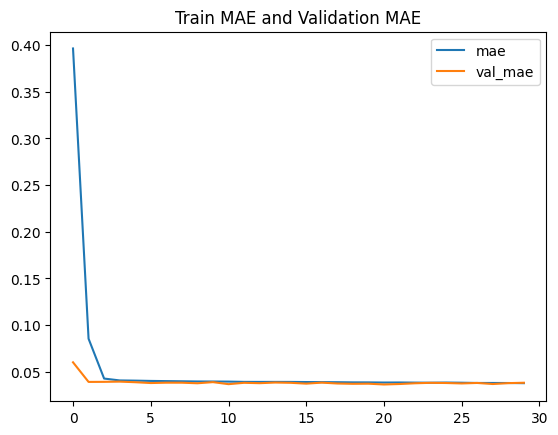

In [65]:
# Graficar MAE
history_df.loc[:, ['mae', 'val_mae']].plot()
plt.title('Train MAE and Validation MAE')

# Mostrar el mejor MAE de validación
print("Best Validation MAE: {:0.4f}".format(history_df['val_mae'].min()))

### Delete outliers

In [66]:
df_venta

,lat,lon,Department,City,rooms,bedrooms,bathrooms,surface_total,price,property_type,operation_type
0,4.826252,-75.683261,Risaralda,Pereira,4.0,4.0,2.0,260.0,270.0,Casa,Venta
1,4.816264,-75.696573,Risaralda,Pereira,4.0,4.0,2.0,154.0,180.0,Casa,Venta
3,4.826252,-75.683261,Risaralda,Pereira,4.0,4.0,2.0,1789.0,270.0,Casa,Venta
4,4.816751,-75.711253,Risaralda,Marsella,4.0,4.0,4.0,100.0,130.0,Casa,Venta
5,11.144643,-74.225311,Magdalena,Santa Marta,3.0,3.0,5.0,66.0,560.0,Casa,Venta
...,...,...,...,...,...,...,...,...,...,...,...
171941,4.635258,-74.190979,Cundinamarca,Bogotá D.C,3.0,3.0,2.0,86.0,120.4,Apartamento,Venta
171942,4.626792,-74.127068,Cundinamarca,Bogotá D.C,3.0,3.0,4.0,190.0,400.0,Apartamento,Venta
171943,4.597044,-74.160915,Cundinamarca,Bogotá D.C,2.0,2.0,2.0,665.0,150.0,Apartamento,Venta
171945,4.644055,-74.128511,Cundinamarca,Bogotá D.C,3.0,3.0,2.0,84.0,410.0,Apartamento,Venta


Input shape: [262]


c:\Users\User\Downloads\Trabajo_econometria\tf-env\lib\site-packages\keras\src\layers\core\dense.py:93: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Best Validation Loss: 0.0302
683/683 ━━━━━━━━━━━━━━━━━━━━ 0s 416us/step
MAE real (en precio): 177.56


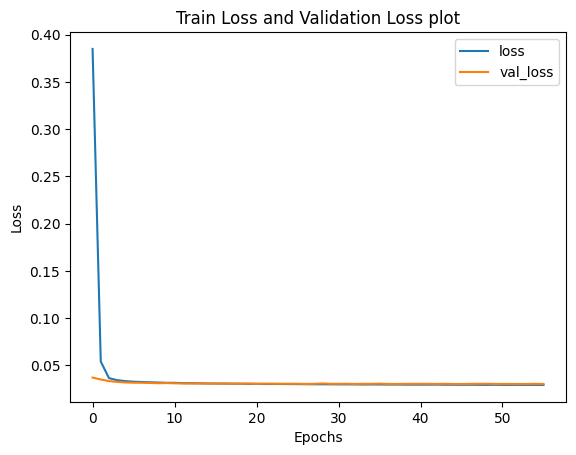

In [67]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.compose import make_column_transformer
from sklearn.preprocessing import OneHotEncoder, MinMaxScaler
from sklearn.metrics import mean_absolute_error
from tensorflow import keras
from tensorflow.keras import layers
import matplotlib.pyplot as plt

# ----------------------------
# 1. Eliminar outliers en 'price'
# ----------------------------
Q1 = df_venta['price'].quantile(0.25)
Q3 = df_venta['price'].quantile(0.75)
IQR = Q3 - Q1

df_venta_clean = df_venta[
    (df_venta['price'] >= Q1 - 1.5 * IQR) &
    (df_venta['price'] <= Q3 + 1.5 * IQR)
]

# ----------------------------
# 2. Eliminar 'operation_type'
# ----------------------------
df_venta_clean = df_venta_clean.drop(columns=['operation_type'])

# ----------------------------
# 3. Separar features y target
# ----------------------------
X = df_venta_clean.drop(columns=['price'])
y = df_venta_clean['price'].values.reshape(-1, 1)

# ----------------------------
# 4. Separar columnas categóricas
# ----------------------------
features_cat = ['Department', 'City', 'property_type']
features_num = [col for col in X.columns if col not in features_cat]

# ----------------------------
# 5. Preprocesamiento de columnas categóricas (corregido)
# ----------------------------
preprocessor = make_column_transformer(
    (OneHotEncoder(handle_unknown='ignore', sparse_output=False), features_cat),
    remainder='passthrough'
)

# ----------------------------
# 6. Separar datos de entrenamiento y validación
# ----------------------------
X_train_S, X_val_S, y_train_S, y_val_S = train_test_split(X, y, test_size=0.2, random_state=42)

# Aplicar OneHotEncoder
X_train_encoded = preprocessor.fit_transform(X_train_S)
X_val_encoded = preprocessor.transform(X_val_S)

# ----------------------------
# 7. Normalizar con MinMaxScaler
# ----------------------------
scaler_X = MinMaxScaler()
scaler_y = MinMaxScaler()

X_train_S_Norm = scaler_X.fit_transform(X_train_encoded)
X_test_S_Norm = scaler_X.transform(X_val_encoded)

y_train_scaled_S = scaler_y.fit_transform(y_train_S)
y_val_scaled_S = scaler_y.transform(y_val_S)

# ----------------------------
# 8. Definir modelo de red neuronal
# ----------------------------
input_shape = [X_train_S_Norm.shape[1]]
print("Input shape: {}".format(input_shape))

model = keras.Sequential([
    layers.Dense(100, activation='relu', input_shape=input_shape),
    layers.BatchNormalization(),
    layers.Dropout(0.3),

    layers.Dense(50, activation='relu'),
    layers.BatchNormalization(),
    layers.Dropout(0.3),

    layers.Dense(1)
])

model.compile(
    optimizer='adam',
    loss='mse',
    metrics=['mae']
)

early_stopping = keras.callbacks.EarlyStopping(
    patience=10,
    min_delta=0.00001,
    restore_best_weights=True,
)

# ----------------------------
# 9. Entrenar el modelo
# ----------------------------
history = model.fit(
    X_train_S_Norm, y_train_scaled_S,
    validation_data=(X_test_S_Norm, y_val_scaled_S),
    batch_size=212,
    epochs=1000,
    callbacks=[early_stopping],
    verbose=0
)

# ----------------------------
# 10. Visualizar curvas de pérdida
# ----------------------------
history_df = pd.DataFrame(history.history)
history_df.loc[:, ['loss', 'val_loss']].plot()
plt.title('Train Loss and Validation Loss plot')
plt.xlabel('Epochs')
plt.ylabel('Loss')

print("Best Validation Loss: {:0.4f}".format(history_df['val_loss'].min()))

# ----------------------------
# 11. MAE en escala original
# ----------------------------
y_pred_scaled = model.predict(X_test_S_Norm)
y_pred_real = scaler_y.inverse_transform(y_pred_scaled)
y_val_real = scaler_y.inverse_transform(y_val_scaled_S)

mae_real = mean_absolute_error(y_val_real, y_pred_real)
print(f"MAE real (en precio): {mae_real:.2f}")

Input shape: [189]


c:\Users\User\Downloads\Trabajo_econometria\tf-env\lib\site-packages\keras\src\layers\core\dense.py:93: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Best Validation Loss: 0.0279
290/290 ━━━━━━━━━━━━━━━━━━━━ 0s 484us/step
MAE real (en precio de arriendo): 0.56


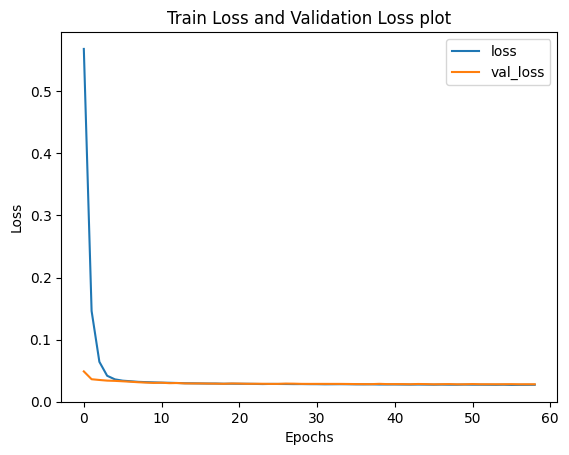

In [68]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.compose import make_column_transformer
from sklearn.preprocessing import OneHotEncoder, MinMaxScaler
from sklearn.metrics import mean_absolute_error
from tensorflow import keras
from tensorflow.keras import layers
import matplotlib.pyplot as plt

# ----------------------------
# 1. Eliminar outliers en 'price'
# ----------------------------
Q1 = df_arriendo['price'].quantile(0.25)
Q3 = df_arriendo['price'].quantile(0.75)
IQR = Q3 - Q1

df_arriendo_clean = df_arriendo[
    (df_arriendo['price'] >= Q1 - 1.5 * IQR) &
    (df_arriendo['price'] <= Q3 + 1.5 * IQR)
]

# ----------------------------
# 2. Eliminar 'operation_type'
# ----------------------------
df_arriendo_clean = df_arriendo_clean.drop(columns=['operation_type'])

# ----------------------------
# 3. Separar features y target
# ----------------------------
X = df_arriendo_clean.drop(columns=['price'])
y = df_arriendo_clean['price'].values.reshape(-1, 1)

# ----------------------------
# 4. Separar columnas categóricas
# ----------------------------
features_cat = ['Department', 'City', 'property_type']
features_num = [col for col in X.columns if col not in features_cat]

# ----------------------------
# 5. Preprocesamiento de columnas categóricas (corregido)
# ----------------------------
preprocessor = make_column_transformer(
    (OneHotEncoder(handle_unknown='ignore', sparse_output=False), features_cat),
    remainder='passthrough'
)

# ----------------------------
# 6. Separar datos de entrenamiento y validación
# ----------------------------
X_train_A, X_val_A, y_train_A, y_val_A = train_test_split(X, y, test_size=0.2, random_state=42)

# Aplicar OneHotEncoder
X_train_encoded = preprocessor.fit_transform(X_train_A)
X_val_encoded = preprocessor.transform(X_val_A)

# ----------------------------
# 7. Normalizar con MinMaxScaler
# ----------------------------
scaler_X = MinMaxScaler()
scaler_y = MinMaxScaler()

X_train_A_Norm = scaler_X.fit_transform(X_train_encoded)
X_test_A_Norm = scaler_X.transform(X_val_encoded)

y_train_scaled_A = scaler_y.fit_transform(y_train_A)
y_val_scaled_A = scaler_y.transform(y_val_A)

# ----------------------------
# 8. Definir modelo de red neuronal
# ----------------------------
input_shape = [X_train_A_Norm.shape[1]]
print("Input shape: {}".format(input_shape))

model = keras.Sequential([
    layers.Dense(100, activation='relu', input_shape=input_shape),
    layers.BatchNormalization(),
    layers.Dropout(0.3),

    layers.Dense(50, activation='relu'),
    layers.BatchNormalization(),
    layers.Dropout(0.3),

    layers.Dense(1)
])

model.compile(
    optimizer='adam',
    loss='mse',
    metrics=['mae']
)

early_stopping = keras.callbacks.EarlyStopping(
    patience=10,
    min_delta=0.00001,
    restore_best_weights=True,
)

# ----------------------------
# 9. Entrenar el modelo
# ----------------------------
history = model.fit(
    X_train_A_Norm, y_train_scaled_A,
    validation_data=(X_test_A_Norm, y_val_scaled_A),
    batch_size=212,
    epochs=1000,
    callbacks=[early_stopping],
    verbose=0
)

# ----------------------------
# 10. Visualizar curvas de pérdida
# ----------------------------
history_df = pd.DataFrame(history.history)
history_df.loc[:, ['loss', 'val_loss']].plot()
plt.title('Train Loss and Validation Loss plot')
plt.xlabel('Epochs')
plt.ylabel('Loss')

print("Best Validation Loss: {:0.4f}".format(history_df['val_loss'].min()))

# ----------------------------
# 11. MAE en escala original
# ----------------------------
y_pred_scaled = model.predict(X_test_A_Norm)
y_pred_real = scaler_y.inverse_transform(y_pred_scaled)
y_val_real = scaler_y.inverse_transform(y_val_scaled_A)

mae_real = mean_absolute_error(y_val_real, y_pred_real)
print(f"MAE real (en precio de arriendo): {mae_real:.2f}")

In [69]:
df_arriendo_clean

,lat,lon,Department,City,rooms,bedrooms,bathrooms,surface_total,price,property_type
2,4.541471,-75.664193,Quindío,Armenia,4.0,4.0,4.0,2500.0,2.00,Casa
15,7.901959,-72.462280,Norte de Santander,Los Patios,2.0,2.0,3.0,66.0,0.70,Casa
28,3.420744,-76.525603,Valle del Cauca,Cali,7.0,7.0,4.0,160.0,2.00,Casa
32,3.394664,-76.553884,Valle del Cauca,Cali,3.0,3.0,2.0,8210.0,1.60,Casa
34,6.341864,-75.542189,Antioquia,Bello,3.0,3.0,1.0,1800.0,1.30,Casa
...,...,...,...,...,...,...,...,...,...,...
171862,4.708821,-74.082623,Cundinamarca,Bogotá D.C,3.0,3.0,2.0,289.0,2.15,Apartamento
171868,4.708820,-74.082676,Cundinamarca,Bogotá D.C,2.0,2.0,2.0,242.0,2.75,Apartamento
171869,4.693691,-74.046000,Cundinamarca,Bogotá D.C,3.0,3.0,2.0,76.0,1.20,Apartamento
171929,4.700428,-74.063401,Cundinamarca,Bogotá D.C,2.0,2.0,1.0,70.0,2.20,Apartamento


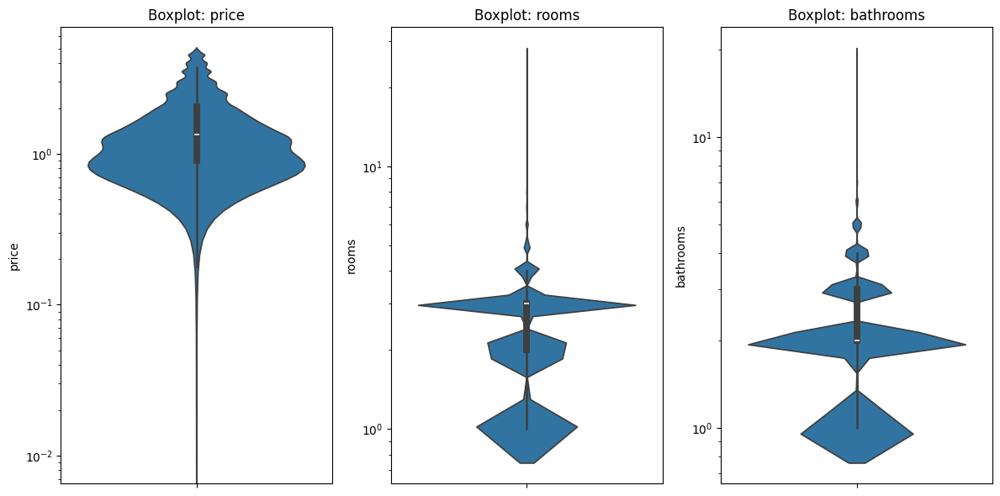

In [70]:
import seaborn as sns
import matplotlib.pyplot as plt

# Lista de columnas numéricas a analizar
columnas = ['price', 'rooms', 'bathrooms']

# Boxplots
plt.figure(figsize=(12, 6))
for i, col in enumerate(columnas):
    plt.subplot(1, 3, i+1)
    sns.violinplot(y=df_arriendo_clean[col])
    plt.title(f'Boxplot: {col}')
    plt.yscale('log')
plt.tight_layout()
plt.show()

Input shape: [183]


c:\Users\User\Downloads\Trabajo_econometria\tf-env\lib\site-packages\keras\src\layers\core\dense.py:93: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Best Validation Loss: 0.0249
277/277 ━━━━━━━━━━━━━━━━━━━━ 0s 493us/step
MAE real (en precio de arriendo): 0.53


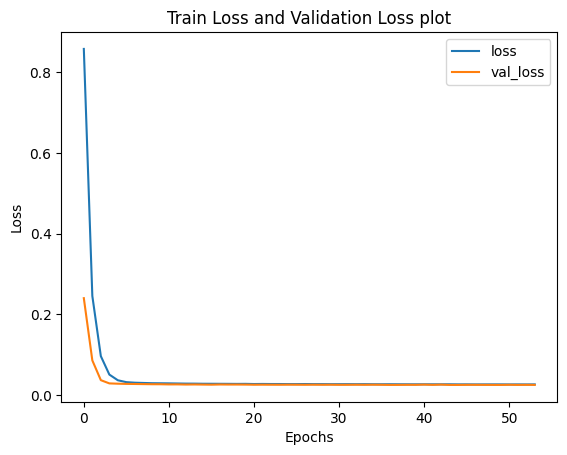

In [71]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.compose import make_column_transformer
from sklearn.preprocessing import OneHotEncoder, MinMaxScaler
from sklearn.metrics import mean_absolute_error
from tensorflow import keras
from tensorflow.keras import layers
import matplotlib.pyplot as plt

# ----------------------------
# 1. Eliminar outliers en 'price', 'bathrooms' y 'rooms'
# ----------------------------
def eliminar_outliers_iqr(df, column):
    Q1 = df[column].quantile(0.25)
    Q3 = df[column].quantile(0.75)
    IQR = Q3 - Q1
    return df[
        (df[column] >= Q1 - 1.5 * IQR) &
        (df[column] <= Q3 + 1.5 * IQR)
    ]

df_arriendo_clean = df_arriendo.copy()

for col in ['price', 'bathrooms', 'rooms']:
    df_arriendo_clean = eliminar_outliers_iqr(df_arriendo_clean, col)

# ----------------------------
# 2. Eliminar 'operation_type'
# ----------------------------
df_arriendo_clean = df_arriendo_clean.drop(columns=['operation_type'])

# ----------------------------
# 3. Separar features y target
# ----------------------------
X = df_arriendo_clean.drop(columns=['price'])
y = df_arriendo_clean['price'].values.reshape(-1, 1)

# ----------------------------
# 4. Separar columnas categóricas
# ----------------------------
features_cat = ['Department', 'City', 'property_type']
features_num = [col for col in X.columns if col not in features_cat]

# ----------------------------
# 5. Preprocesamiento de columnas categóricas
# ----------------------------
preprocessor = make_column_transformer(
    (OneHotEncoder(handle_unknown='ignore', sparse_output=False), features_cat),
    remainder='passthrough'
)

# ----------------------------
# 6. Separar datos de entrenamiento y validación
# ----------------------------
X_train_A, X_val_A, y_train_A, y_val_A = train_test_split(X, y, test_size=0.2, random_state=42)

# Aplicar OneHotEncoder
X_train_encoded = preprocessor.fit_transform(X_train_A)
X_val_encoded = preprocessor.transform(X_val_A)

# ----------------------------
# 7. Normalizar con MinMaxScaler
# ----------------------------
scaler_X = MinMaxScaler()
scaler_y = MinMaxScaler()

X_train_A_Norm = scaler_X.fit_transform(X_train_encoded)
X_test_A_Norm = scaler_X.transform(X_val_encoded)

y_train_scaled_A = scaler_y.fit_transform(y_train_A)
y_val_scaled_A = scaler_y.transform(y_val_A)

# ----------------------------
# 8. Definir modelo de red neuronal
# ----------------------------
input_shape = [X_train_A_Norm.shape[1]]
print("Input shape: {}".format(input_shape))

model = keras.Sequential([
    layers.Dense(100, activation='relu', input_shape=input_shape),
    layers.BatchNormalization(),
    layers.Dropout(0.3),

    layers.Dense(50, activation='relu'),
    layers.BatchNormalization(),
    layers.Dropout(0.3),

    layers.Dense(1)
])

model.compile(
    optimizer='adam',
    loss='mse',
    metrics=['mae']
)

early_stopping = keras.callbacks.EarlyStopping(
    patience=10,
    min_delta=0.00001,
    restore_best_weights=True,
)

# ----------------------------
# 9. Entrenar el modelo
# ----------------------------
history = model.fit(
    X_train_A_Norm, y_train_scaled_A,
    validation_data=(X_test_A_Norm, y_val_scaled_A),
    batch_size=212,
    epochs=1000,
    callbacks=[early_stopping],
    verbose=0
)

# ----------------------------
# 10. Visualizar curvas de pérdida
# ----------------------------
history_df = pd.DataFrame(history.history)
history_df.loc[:, ['loss', 'val_loss']].plot()
plt.title('Train Loss and Validation Loss plot')
plt.xlabel('Epochs')
plt.ylabel('Loss')

print("Best Validation Loss: {:0.4f}".format(history_df['val_loss'].min()))

# ----------------------------
# 11. MAE en escala original
# ----------------------------
y_pred_scaled = model.predict(X_test_A_Norm)
y_pred_real = scaler_y.inverse_transform(y_pred_scaled)
y_val_real = scaler_y.inverse_transform(y_val_scaled_A)

mae_real = mean_absolute_error(y_val_real, y_pred_real)
print(f"MAE real (en precio de arriendo): {mae_real:.2f}")


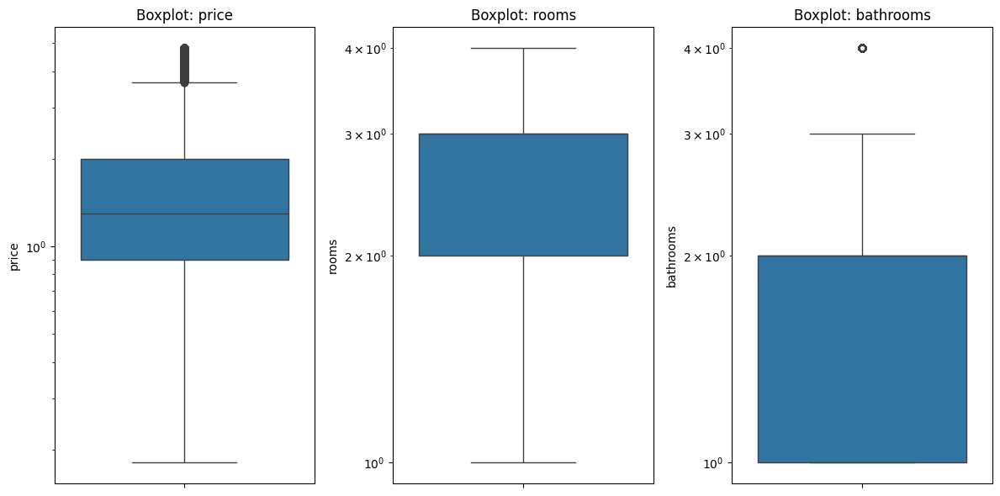

In [72]:
import seaborn as sns
import matplotlib.pyplot as plt

# Lista de columnas numéricas a analizar
columnas = ['price', 'rooms', 'bathrooms']

# Boxplots
plt.figure(figsize=(12, 6))
for i, col in enumerate(columnas):
    plt.subplot(1, 3, i+1)
    sns.boxplot(y=df_arriendo_clean[col])
    plt.title(f'Boxplot: {col}')
    plt.yscale('log')
plt.tight_layout()
plt.show()

C:\Users\User\AppData\Local\Temp\ipykernel_9868\2666811998.py:15: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=cor_target.values, y=cor_target.index, palette="coolwarm")


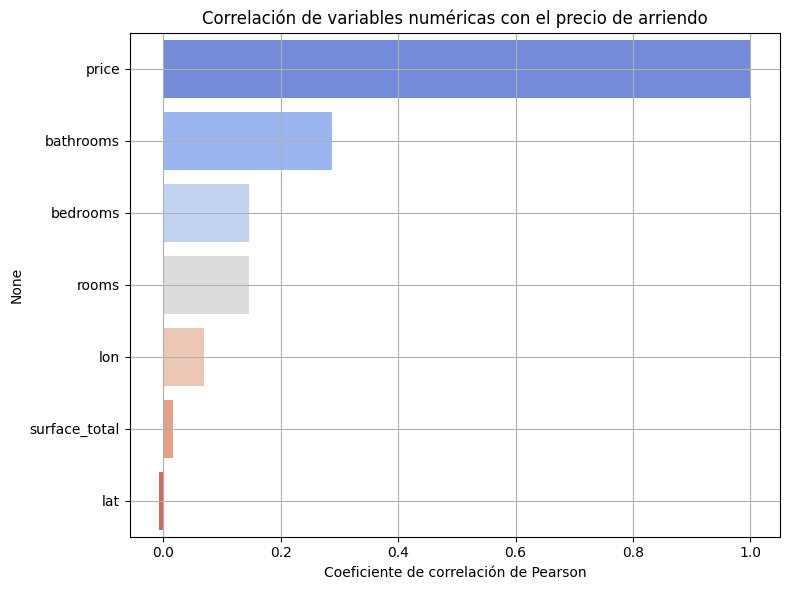

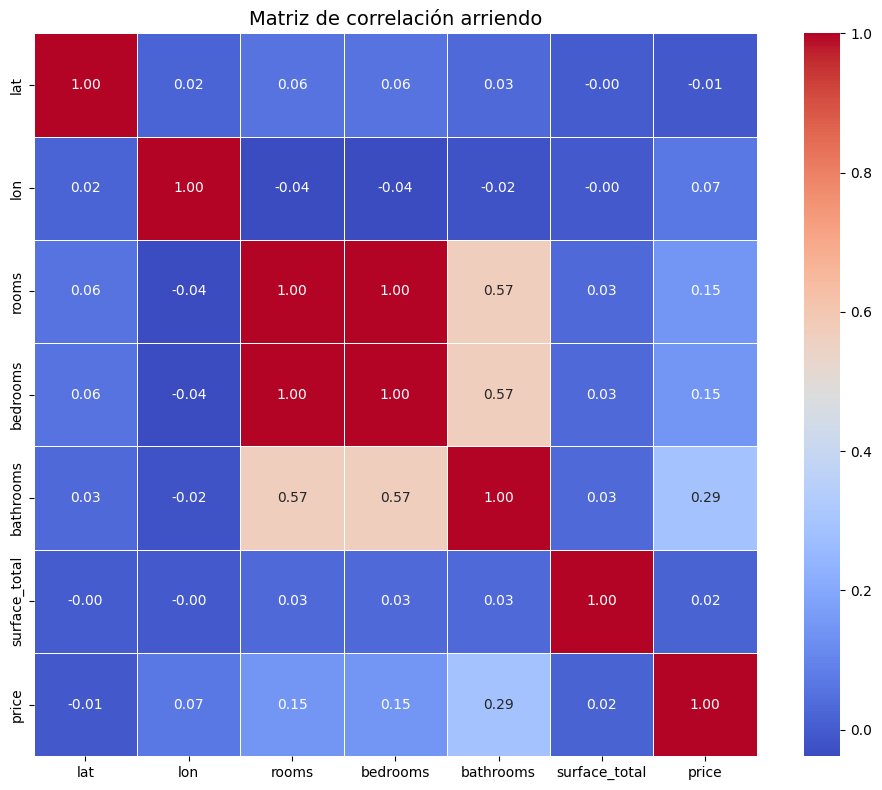

In [73]:
import seaborn as sns
import matplotlib.pyplot as plt

# Filtrar solo columnas numéricas
numerical_cols = df_arriendo_clean.select_dtypes(include=['number'])

# Calcular matriz de correlación
correlation_matrix = numerical_cols.corr()

# Ordenar por la correlación con 'price'
cor_target = correlation_matrix['price'].sort_values(ascending=False)

# Mostrar solo las correlaciones con 'price'
plt.figure(figsize=(8, 6))
sns.barplot(x=cor_target.values, y=cor_target.index, palette="coolwarm")
plt.title("Correlación de variables numéricas con el precio de arriendo")
plt.xlabel("Coeficiente de correlación de Pearson")
plt.grid(True)
plt.tight_layout()
plt.show()

# Configurar tamaño y estilo del gráfico
plt.figure(figsize=(10, 8))
sns.heatmap(correlation_matrix, annot=True, fmt=".2f", cmap="coolwarm", square=True, linewidths=0.5)

plt.title("Matriz de correlación arriendo", fontsize=14)
plt.tight_layout()
plt.show()


C:\Users\User\AppData\Local\Temp\ipykernel_9868\3789373911.py:15: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=cor_target.values, y=cor_target.index, palette="coolwarm")


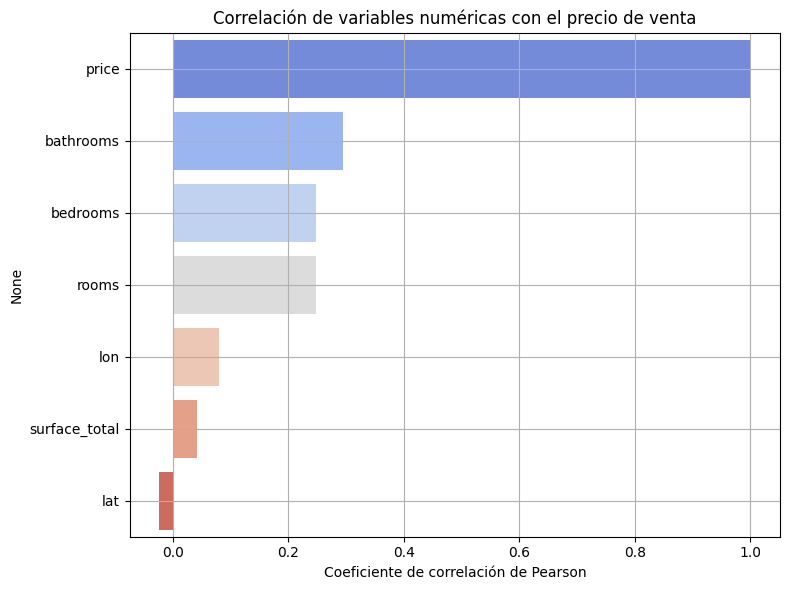

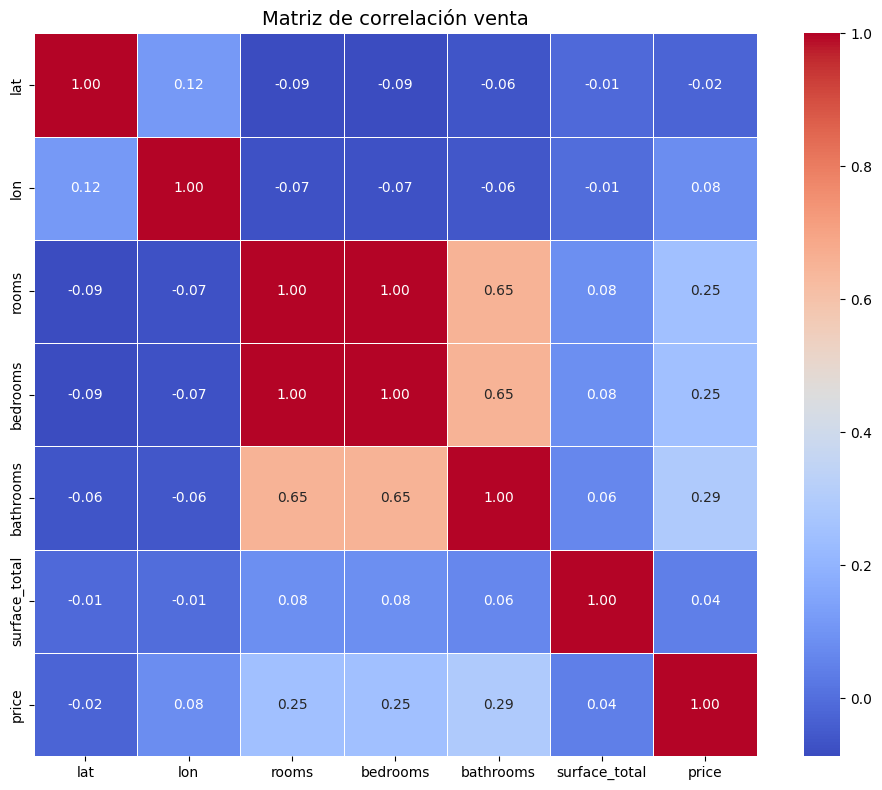

In [74]:
import seaborn as sns
import matplotlib.pyplot as plt

# Filtrar solo columnas numéricas
numerical_cols = df_venta_clean.select_dtypes(include=['number'])

# Calcular matriz de correlación
correlation_matrix = numerical_cols.corr()

# Ordenar por la correlación con 'price'
cor_target = correlation_matrix['price'].sort_values(ascending=False)

# Mostrar solo las correlaciones con 'price'
plt.figure(figsize=(8, 6))
sns.barplot(x=cor_target.values, y=cor_target.index, palette="coolwarm")
plt.title("Correlación de variables numéricas con el precio de venta")
plt.xlabel("Coeficiente de correlación de Pearson")
plt.grid(True)
plt.tight_layout()
plt.show()

# Configurar tamaño y estilo del gráfico
plt.figure(figsize=(10, 8))
sns.heatmap(correlation_matrix, annot=True, fmt=".2f", cmap="coolwarm", square=True, linewidths=0.5)

plt.title("Matriz de correlación venta", fontsize=14)
plt.tight_layout()
plt.show()